In [114]:
%load_ext autoreload
%autoreload 2
import numpy as np
import pandas as p
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib
from matplotlib.gridspec import GridSpec
from scipy.stats import pearsonr
from scipy.spatial import distance
from scipy.stats.mstats import gmean
from sklearn.linear_model import LinearRegression
from statsmodels.nonparametric.smoothers_lowess import lowess 
from skmisc.loess import loess
%matplotlib inline
from itertools import combinations
from itertools import chain
from itertools import product

from multiprocessing import Pool
import sys
import os
import copy
sns.set_style('white')
sns.set_style('ticks')
sns.set_color_codes()

fgm_simulation_path = '/Users/grantkinsler/Documents/Stanford/Research/StarryNight/Git/starry-night/Simulations/FGM_simulation_callable.py'
sys.path.append(os.path.dirname(os.path.expanduser(fgm_simulation_path)))
from FGM_simulation_callable import simulation, nball_pull, gaussian_fitness

tools_path = '../code/tools.py'
graphs_path = '../code/graphs.py'
sys.path.append(os.path.dirname(os.path.expanduser(tools_path)))
sys.path.append(os.path.dirname(os.path.expanduser(graphs_path)))
import tools
import graphs
from tools import mutant_colorset
from tools import condition_colorset
from tools import renamed_conditions

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [4]:
cov_thresh = 1e6

fitness_data = p.read_csv('../data/DoubleBC_Merged_Fitness_Atish_Weighted_Default_AllConditions_IncludingOld_swapsremoved.csv')

merged_fitness_data = fitness_data

In [5]:
mutant_train_set = p.read_csv('../data/mutant_train_set.csv')
training_bcs = mutant_train_set['barcode'].values

mutant_minimal_train_set = p.read_csv('../data/mutant_minimal_train_set.csv')
minimal_training_bcs = mutant_minimal_train_set['barcode'].values

mutant_minimal_train_set = p.read_csv('../data/mutant_minimal_test_set.csv')
minimal_testing_bcs = mutant_minimal_train_set['barcode'].values

In [6]:
# old_conditions = {
#                   '3':['3.1','3.2','3.3'],
#                   '6':['6.1','6.2','6.3'],
#                   '13':['13.1','13.2','13.3'],
#                   '18':['18.1','18.2','18.3'],
#                   '20':['20.1','20.2','20.3'],
#                   '21':['21.1','21.2','21.3'],
#                   '23':['23.1','23.2','23.3']
#                  }

# bigbatch_conditions = {
#                         '1BB_M3':['A','B','C','D'],
#                         '1BB_Baffle':['E','F'],
#                         '1BB_1.4%Gluc' :['G','H'],
#                         '1BB_1.8%Gluc' :['I','J'],
#                         '1BB_0.2MNaCl' :['K','L'],
# #                         '1BB_0.2MNaCl' :['K'], 
#                         '1BB_0.5MNaCl' :['M','N'],
#                         '1BB_0.2MKCl' :['O'],
#                         '1BB_0.5MKCl' :['P'],
#                         '1BB_8.5uMGdA' :['Q','R'],
#                         '1BB_17uMGdA' :['S','T'],
#                         '1BB_2ugFlu' :['U','V'],
#                         '1BB_0.5ugFlu' :['W','X'],
#                         '1BB_1%Raf' :['Y','Z'],
#                         '1BB_0.5%Raf' :['AA','BB'],
#                         '1BB_1%Gly' :['CC','DD'],
#                         '1BB_1%EtOH' :['EE','FF'],
#                         '1BB_SucRaf' :['GG'],
#                       }

old_conditions = {
#                   '3':['t3.1','t3.2','t3.3'],
#                   '6':['t6.1','t6.2','t6.3'],
#                   '13':['t13.1','t13.2','t13.3'],
#                   '18':['t18.1','t18.2','t18.3'],
                  '19':['t19.1','t19.2','t19.3'],
#                   '20':['t20.1','t20.2','t20.3'],
#                   '21':['t21.1','t21.2','t21.3'],
#                   '23':['t23.1','t23.2','t23.3'],
                  'M3_Batch_3':['3.1','3.2','3.3'],
                  'M3_Batch_6':['6.1','6.2','6.3'],
                  'M3_Batch_13':['13.1','13.2','13.3'],
                  'M3_Batch_18':['18.1','18.2','18.3'],
#                   'M3_Batch_19':['t19.1','t19.2','t19.3'],
                  'M3_Batch_20':['20.1','20.2','20.3'],
                  'M3_Batch_21':['21.1','21.2','21.3'],
                  'M3_Batch_23':['23.1','23.2','23.3'],

                    ## radicicol
                    ## benomyl
                    ## fluconazole
                    ## Glucose gradient
    
    }

bigbatch_conditions = {
                        '1BB_M3':['A','B','C','D'],
                        '1BB_Baffle':['E','F'],
                        '1BB_1.4%Gluc' :['G','H'],
                        '1BB_1.8%Gluc' :['I','J'],
                        '1BB_0.2MNaCl' :['K','L'],
#                         '1BB_0.2MNaCl' :['K'], 
                        '1BB_0.5MNaCl' :['M','N'],
                        '1BB_0.2MKCl' :['O'],
                        '1BB_0.5MKCl' :['P'],
                        '1BB_8.5uMGdA' :['Q','R'],
                        '1BB_17uMGdA' :['S','T'],
                        '1BB_2ugFlu' :['U','V'],
                        '1BB_0.5ugFlu' :['W','X'],
                        '1BB_1%Raf' :['Y','Z'],
                        '1BB_0.5%Raf' :['AA','BB'],
                        '1BB_1%Gly' :['CC','DD'],
                        '1BB_1%EtOH' :['EE','FF'],
                        '1BB_SucRaf' :['GG'],
                      }



# old_nonm3_conditions = [
# #     '1.4Glucose', '1.6Glucose', '1.7Glucose', '1.8Glucose',
#        '2.5Glucose', '24_Hour_Transfer_PC', 'Benomyl_2ug/mL',
#        'DMSO', 'Ferm_40_Hour_Transfer', 'Ferm_44_Hour_Transfer',
#        'Ferm_50_Hour_Transfer', 'Ferm_54_Hour_Transfer',
#        'Fluconazole_2ug/mL', 'Geldanamycin8.5uM','Radicicol_5uM', 'Resp_5_Day_Transfer',
#        'Resp_7_Day_Transfer']

old_nonm3_conditions = {'Ferm_44hr_Transfer':['t14.1','t14.2','t14.3'],
                  'Ferm_40hr_Transfer':['t15.1','t15.2','t15.3'],
                  'Ferm_54hr_Transfer':['t16.1','t16.2','t16.3'],
                  'Ferm_50hr_Transfer':['t17.1','t17.2','t17.3'],
                  'Resp_24hr_Transfer':['t5.1','t5.2','t5.3'],
                  'Resp_3Day_Transfer':['t7.1','t7.2','t7.3'],
                  'Resp_4Day_Transfer':['t8.1','t8.2','t8.3'],
                  'Resp_5Day_Transfer':['t25.1','t25.2','t25.3'],
                  'Resp_6Day_Transfer':['t26.1','t26.2','t26.3'],
                  'Resp_7Day_Transfer':['t27.1','t27.2','t27.3'],
                  'DMSO':['t1.1','t1.2','t1.3'],
                  'Geldanamycin8.5uM':['t2.4','t2.5','t2.6'],}




# m3_conditions = {**old_conditions,}
conditions = {**old_conditions, **bigbatch_conditions}
conditions = {**conditions, **old_nonm3_conditions}
all_conditions = conditions.keys()
all_reps = [rep for reps in conditions.values() for rep in reps]

m3_conditions = list(old_conditions.keys()) + ['1BB_M3']
m3_reps = [rep for condition in m3_conditions for rep in conditions[condition]]



In [7]:
diploid_mean = np.mean(merged_fitness_data[merged_fitness_data['gene']=='Diploid']['1BB_M3_fitness'])
diploid_std = np.std(merged_fitness_data[merged_fitness_data['gene']=='Diploid']['1BB_M3_fitness'])

mutation_type = []
for entry in range(len(merged_fitness_data.index)):
    gene_name = merged_fitness_data['gene'].values[entry]
    this_type = merged_fitness_data['type'].values[entry]
    m3_fitness = merged_fitness_data['1BB_M3_fitness'].values[entry]
    if gene_name == 'IRA1':
        if this_type == 'missense_variant':
            mutation_type.append('IRA1_missense')
        elif this_type in ['frameshift_variant','stop_gained']:
            mutation_type.append('IRA1_nonsense')
        else:
            mutation_type.append('IRA1_other')
    elif gene_name == 'Diploid':
        if m3_fitness > diploid_mean+2*diploid_std:
            mutation_type.append('Diploid_adaptive')
        else:
            mutation_type.append('Diploid')
        
    else:
        mutation_type.append(gene_name)
        
            
merged_fitness_data['mutation_type'] = mutation_type

In [8]:
full_neutral_list = [17615,18486,42040,45014,58284,63611,73731,74185,80465,94896
,120600,125697,132511,134852,135750,190551,228237,238783,255561,298344
,308537,316954,317346,335717,411685,454359,469053] 

### from previous list but never has fitness above 3.5% (per gen) in any of 5000bc experiments
supergood_neutral = [17615, 24362, 42040, 71926, 72939, 73802, 80465, 109476, 113483, 
                     134852, 135750, 238783, 263665, 276406, 316954, 335717, 454359] 

### pulled from supergood list and spiked into 1BigBatch experiments
neutral_spikes = [17615,24362,42040,71926,73802,109476,113483,134852,263665,316954]

# neutrals = full_neutral_list
neutrals = list(np.unique(full_neutral_list+supergood_neutral+neutral_spikes))

In [9]:
this_data = merged_fitness_data
this_data = this_data.replace([np.inf, -np.inf], np.nan)
# this_data = this_data.dropna('columns',how='all')
this_data = this_data.dropna()

this_data = this_data.sort_values('barcode')

m3_cols = [col + '_fitness' for col in m3_conditions]
m3_conditions = m3_cols

nonm3_cols = [col + '_fitness' for col in bigbatch_conditions.keys() if (col + '_fitness') not in m3_cols]
nonm3_cols = nonm3_cols + [col + '_fitness' for col in old_nonm3_conditions.keys()]
nonm3_conditions = nonm3_cols

fitness_cols = m3_cols + nonm3_cols

fitness = this_data[fitness_cols].values

n_mutants = fitness.shape[0]
n_conditions = fitness.shape[1]


([<matplotlib.axis.YTick at 0x116572908>,
 <a list of 6 Text yticklabel objects>)

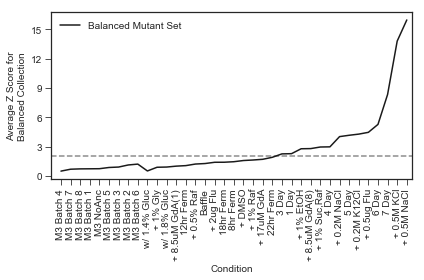

In [10]:
used_mutants = [bc for bc in this_data['barcode'].values if bc in (list(minimal_training_bcs) + list(minimal_testing_bcs))]
      
all_mut_locs = sorted(list(np.where(np.isin(this_data['barcode'].values,used_mutants))[0]))


m3_means = np.nanmean(this_data[m3_cols].values[all_mut_locs,:],axis=1)
m3_stds = np.nanstd(this_data[m3_cols].values[all_mut_locs,:],axis=1)

repeated_means = np.repeat(m3_means,len(nonm3_cols)).reshape(len(m3_means),len(nonm3_cols))
repeated_stds = np.repeat(m3_stds,len(nonm3_cols)).reshape(len(m3_stds),len(nonm3_cols))
nonm3_z_scores = np.abs((this_data[nonm3_cols].values[all_mut_locs,:]-repeated_means)/repeated_stds)

repeated_means = np.repeat(m3_means,len(m3_cols)).reshape(len(m3_means),len(m3_cols))
repeated_stds = np.repeat(m3_stds,len(m3_cols)).reshape(len(m3_stds),len(m3_cols))
m3_z_scores = np.abs((this_data[m3_cols].values[all_mut_locs,:]-repeated_means)/repeated_stds)

mean_m3_z_scores = m3_z_scores
mean_nonm3_z_scores = nonm3_z_scores

sorted_nonm3_cols = np.asarray(nonm3_cols)[np.argsort(np.mean(nonm3_z_scores,axis=0))]
sorted_m3_cols = np.asarray(m3_cols)[np.argsort(np.mean(m3_z_scores,axis=0))]
plt.plot(sorted(np.mean(m3_z_scores,axis=0))+sorted(np.mean(nonm3_z_scores,axis=0)),'-',color='k',alpha=1.0,label='Balanced Mutant Set')

all_cols = list(sorted_m3_cols)+list(sorted_nonm3_cols)
plt.xticks(range(len(all_cols)),[renamed_conditions[col.split('_fitness')[0]] for col in (all_cols)],rotation=90)

plt.legend()
# plt.ylim(0,7)
plt.xlim(-1,len(m3_conditions)+len(nonm3_conditions)-0.5)
plt.ylabel('Average Z Score for\nBalanced Collection')
plt.xlabel('Condition')

plt.tight_layout()
plt.axhline(2,color='k',linestyle='--',alpha=0.5)
plt.yticks(range(0,16,3),range(0,16,3))
# plt.savefig('z_scores_minimal_comparison.pdf',bbox_inches='tight')

(0, 10)

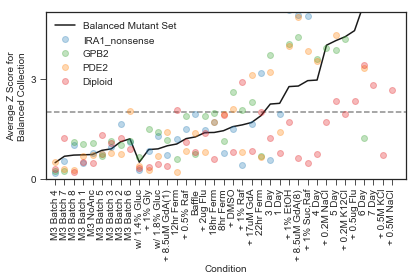

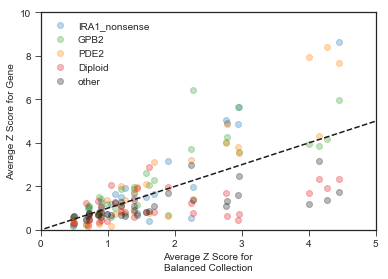

In [11]:
used_mutants = [bc for bc in this_data['barcode'].values if bc in (list(minimal_training_bcs) + list(minimal_testing_bcs))]
      
all_mut_locs =sorted(list(np.where(np.isin(this_data['barcode'].values,used_mutants))[0]))

m3_means = np.nanmean(this_data[m3_cols].values[all_mut_locs,:],axis=1)
m3_stds = np.nanstd(this_data[m3_cols].values[all_mut_locs,:],axis=1)

repeated_means = np.repeat(m3_means,len(nonm3_cols)).reshape(len(m3_means),len(nonm3_cols))
repeated_stds = np.repeat(m3_stds,len(nonm3_cols)).reshape(len(m3_stds),len(nonm3_cols))
nonm3_z_scores = np.abs((this_data[nonm3_cols].values[all_mut_locs,:]-repeated_means)/repeated_stds)

repeated_means = np.repeat(m3_means,len(m3_cols)).reshape(len(m3_means),len(m3_cols))
repeated_stds = np.repeat(m3_stds,len(m3_cols)).reshape(len(m3_stds),len(m3_cols))
m3_z_scores = np.abs((this_data[m3_cols].values[all_mut_locs,:]-repeated_means)/repeated_stds)

allgenes_m3_z_scores = m3_z_scores
allgenes_nonm3_z_scores = nonm3_z_scores

sorted_nonm3_cols = np.asarray(nonm3_cols)[np.argsort(np.mean(nonm3_z_scores,axis=0))]
sorted_m3_cols = np.asarray(m3_cols)[np.argsort(np.mean(m3_z_scores,axis=0))]
plt.plot(sorted(np.mean(m3_z_scores,axis=0))+sorted(np.mean(nonm3_z_scores,axis=0)),'-',color='k',alpha=1.0,label='Balanced Mutant Set')

all_cols = list(sorted_m3_cols)+list(sorted_nonm3_cols)
plt.xticks(range(len(all_cols)),[renamed_conditions[col.split('_fitness')[0]] for col in (all_cols)],rotation=90)


plt.legend()
# plt.ylim(0,7)
plt.xlim(-1,len(m3_conditions)+len(nonm3_conditions)+0.5)
plt.ylabel('Average Z Score for\nBalanced Collection')
plt.xlabel('Condition')

plt.tight_layout()
plt.axhline(2,color='k',linestyle='--',alpha=0.5)
plt.yticks(range(0,16,3),range(0,16,3))

# plt.savefig('z_scores_minimal_comparison.pdf',bbox_inches='tight')



gene_list = ['IRA1','GPB2','PDE2','Diploid']
gene_list = ['IRA1_nonsense','IRA1_missense','GPB2','PDE2','Diploid']
gene_list = ['IRA1_nonsense','GPB2','PDE2','Diploid']
for gene in gene_list:
    
    used_mutants = [bc for bc in this_data[this_data['mutation_type']==gene]['barcode'].values]
    this_gene_locs =sorted(list(np.where(np.isin(this_data['barcode'].values,used_mutants))[0]))
    
    m3_means = np.nanmean(this_data[m3_cols].values[this_gene_locs,:],axis=1)
    m3_stds = np.nanstd(this_data[m3_cols].values[this_gene_locs,:],axis=1)

    repeated_means = np.repeat(m3_means,len(nonm3_cols)).reshape(len(m3_means),len(nonm3_cols))
    repeated_stds = np.repeat(m3_stds,len(nonm3_cols)).reshape(len(m3_stds),len(nonm3_cols))
    thisgene_nonm3_z_scores = np.abs((this_data[nonm3_cols].values[this_gene_locs,:]-repeated_means)/repeated_stds)

    repeated_means = np.repeat(m3_means,len(m3_cols)).reshape(len(m3_means),len(m3_cols))
    repeated_stds = np.repeat(m3_stds,len(m3_cols)).reshape(len(m3_stds),len(m3_cols))
    thisgene_m3_z_scores = np.abs((this_data[m3_cols].values[this_gene_locs,:]-repeated_means)/repeated_stds)

    sorted_nonm3_cols = np.asarray(nonm3_cols)[np.argsort(np.mean(allgenes_nonm3_z_scores,axis=0))]
    sorted_m3_cols = np.asarray(m3_cols)[np.argsort(np.mean(allgenes_m3_z_scores,axis=0))]
    plt.plot(list(np.mean(thisgene_m3_z_scores,axis=0)[np.argsort(np.mean(allgenes_m3_z_scores,axis=0))])+
              list(np.mean(thisgene_nonm3_z_scores,axis=0)[np.argsort(np.mean(allgenes_nonm3_z_scores,axis=0))])
             ,'o',color=mutant_colorset[gene],alpha=0.3,label=gene)
plt.legend()

# plt.savefig('z_scores_minimal_comparison_plusmore.pdf',bbox_inches='tight')

plt.ylim(0,5)
# plt.savefig('z_scores_minimal_comparison_plusmore_zoomed.pdf',bbox_inches='tight')   


gene_list = ['IRA1','GPB2','PDE2','Diploid']
gene_list = ['IRA1_nonsense','IRA1_missense','GPB2','PDE2','Diploid','other']
gene_list = ['IRA1_nonsense','GPB2','PDE2','Diploid','other']

mean_std_bygene = {}

plt.figure()
for gene in gene_list:
    
#     plt.figure()
    
#     plt.title(gene)
    
    used_mutants = [bc for bc in this_data[this_data['mutation_type']==gene]['barcode'].values]
    this_gene_locs =sorted(list(np.where(np.isin(this_data['barcode'].values,used_mutants))[0]))
    
    m3_means = np.nanmean(this_data[m3_cols].values[this_gene_locs,:],axis=1)
    m3_stds = np.nanstd(this_data[m3_cols].values[this_gene_locs,:],axis=1)

    repeated_means = np.repeat(m3_means,len(nonm3_cols)).reshape(len(m3_means),len(nonm3_cols))
    repeated_stds = np.repeat(m3_stds,len(nonm3_cols)).reshape(len(m3_stds),len(nonm3_cols))
    thisgene_nonm3_z_scores = np.abs((this_data[nonm3_cols].values[this_gene_locs,:]-repeated_means)/repeated_stds)

    repeated_means = np.repeat(m3_means,len(m3_cols)).reshape(len(m3_means),len(m3_cols))
    repeated_stds = np.repeat(m3_stds,len(m3_cols)).reshape(len(m3_stds),len(m3_cols))
    thisgene_m3_z_scores = np.abs((this_data[m3_cols].values[this_gene_locs,:]-repeated_means)/repeated_stds)
    
    mean_std_bygene[gene] = [np.mean(m3_means),np.mean(m3_stds)]


    sorted_nonm3_cols = np.asarray(nonm3_cols)[np.argsort(np.mean(allgenes_nonm3_z_scores,axis=0))]
    sorted_m3_cols = np.asarray(m3_cols)[np.argsort(np.mean(allgenes_m3_z_scores,axis=0))]
    
    plt.plot((list(np.mean(allgenes_m3_z_scores ,axis=0)[np.argsort(np.mean(allgenes_m3_z_scores ,axis=0))])+
              list(np.mean(allgenes_nonm3_z_scores,axis=0)[np.argsort(np.mean(allgenes_nonm3_z_scores,axis=0))])),
             (list(np.mean(thisgene_m3_z_scores,axis=0)[np.argsort(np.mean(allgenes_m3_z_scores ,axis=0))])+
              list(np.mean(thisgene_nonm3_z_scores,axis=0)[np.argsort(np.mean(allgenes_nonm3_z_scores,axis=0))]))
             ,'o',color=mutant_colorset[gene],alpha=0.3,label=gene)
xmin,xmax = plt.xlim()
ymin,ymax = plt.ylim()
onetoone = [min([xmin,ymin]),max([xmax,ymax])]
plt.plot(onetoone,onetoone,'k--')
plt.legend()
plt.xlabel('Average Z Score for\nBalanced Collection')
plt.ylabel('Average Z Score for Gene')
plt.xlim(0,20)
# plt.savefig('z_score_comparison_allgenes.pdf')

plt.xlim(0,5)
plt.ylim(0,10)
# plt.savefig('z_score_comparison_allgenes_zoomed.pdf')
    
    




([<matplotlib.axis.YTick at 0x114dd1320>,
 <a list of 12 Text yticklabel objects>)

<Figure size 432x288 with 0 Axes>

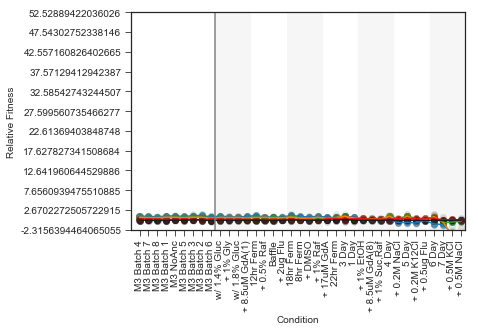

In [12]:
# test_mutant_data = this_data[~this_data['barcode'].isin(minimal_training_bcs)]

mutant_data = this_data[this_data['barcode'].isin((list(minimal_training_bcs)+list(minimal_testing_bcs)))]

m3_conditions = sorted_m3_cols
nonm3_conditions = sorted_nonm3_cols


this_gene = ['GPB2','PDE2','IRA1','Diploid','other']
this_gene = ['IRA1_nonsense','IRA1_missense','GPB2','PDE2','Diploid','other']
this_gene = ['IRA1_nonsense','GPB2','PDE2','Diploid','other']


# this
this_gene_data = mutant_data[mutant_data['mutation_type'].isin(this_gene)]


this_gene_locs = np.where(np.isin(mutant_data['barcode'].values,this_gene_data['barcode'].values))[0]
jitters = [tools.jitter_point(0,0.01) for bc in range(len(this_gene_data[m3_conditions[0]].values)) ]

plt.figure()
fig,ax = plt.subplots()

for i in range(7):
    if (i % 2) == 0:
#         print(i)
        rect = matplotlib.patches.Rectangle((len(m3_conditions)+1+4*i-0.5,ymin),4,ymax-ymin,
                                        linewidth=0,edgecolor='gray',facecolor='gray',alpha=0.07)
    
        ax.add_patch(rect)

# plt.title(f'Predictions with {rank+1} components')
for i,col in enumerate(m3_conditions):
    for bc in range(len(this_gene_data[col].values)):
        plt.scatter([i + 1 + jitters[bc]],this_gene_data[col].values[bc],alpha=0.1,color=mutant_colorset[this_gene_data['mutation_type'].values[bc]]) 

for i,col in enumerate(nonm3_conditions):
    for bc in range(len(this_gene_data[col].values)):
        plt.scatter([len(m3_conditions)+i + 1 + jitters[bc]],this_gene_data[col].values[bc],alpha=0.1,color=mutant_colorset[this_gene_data['mutation_type'].values[bc]]) 

for gene in this_gene:
    this_gene_data = mutant_data[mutant_data['mutation_type']==gene]
    data = np.median(np.asarray([this_gene_data[col].values for col in (list(m3_conditions) + list(nonm3_conditions))]),axis=1)
    plt.plot(range(1,len((list(m3_conditions) + list(nonm3_conditions)))+1),data,alpha=1.0,color=mutant_colorset[gene],label=gene)

plt.axvline(x=len(m3_conditions)+0.5,color='gray')
# plt.legend()
plt.xticks(range(1,len(m3_conditions)+len(nonm3_conditions)+1),[renamed_conditions[col.split('_fitness')[0]] for col in (list(m3_conditions) + list(nonm3_conditions))],rotation=90)


plt.xlim(0.0,len(m3_conditions)+len(nonm3_conditions)+0.5)
plt.ylabel('Relative Fitness')
plt.xlabel('Condition')



# plt.savefig('relative_fitness_line_dots_noylim.pdf',bbox_inches='tight')

plt.ylim(-0.5,1.8)


# plt.savefig('relative_fitness_line_dots.pdf',bbox_inches='tight')

plt.ylim(-1.25,1.5)
plt.yticks(np.linspace(ymin,ymax,12),np.linspace(ymin,ymax,12))

# plt.savefig('relative_fitness_line_dots_matchedylim.pdf',bbox_inches='tight')



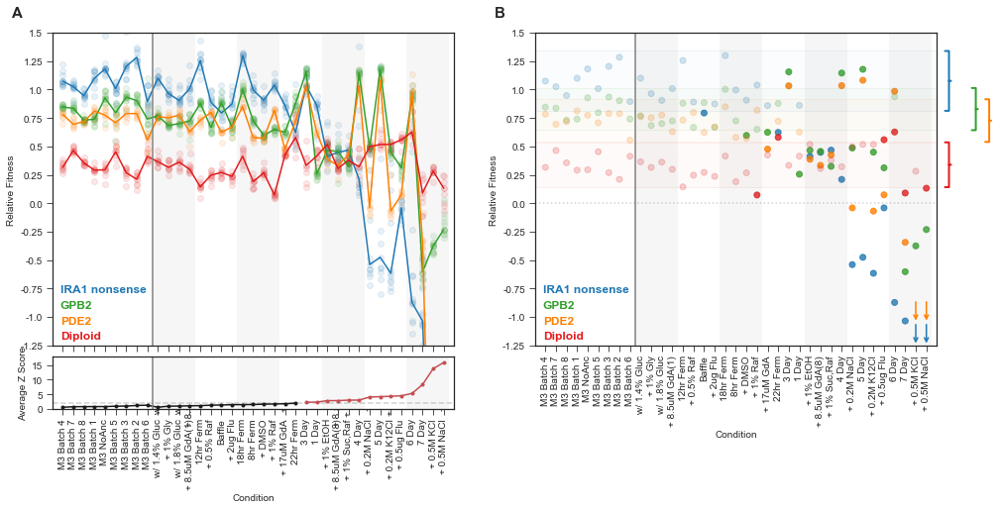

In [13]:
fig = plt.figure(figsize=(2*8,2*6+1))
gs = GridSpec(3, 2, width_ratios=[1, 1], height_ratios=[6, 1, 6],hspace=0.05)

ax1 = fig.add_subplot(gs[0])

gene_list = ['IRA1_nonsense','IRA1_missense','GPB2','PDE2','Diploid','other']
gene_list = ['IRA1_nonsense','IRA1_missense','GPB2','PDE2','Diploid']
gene_list = ['IRA1_nonsense','GPB2','PDE2','Diploid']

# this_gene = ['IRA1_nonsense','IRA1_missense','GPB2','PDE2','Diploid','other']
graphs.fitness_featured_genes_figure(ax1,this_data,minimal_training_bcs,minimal_testing_bcs,m3_conditions,nonm3_conditions,gene_list,ymin=-1.25,ymax=1.5,yticknum=12)
plt.text(s='A',x=-0.1,y=1.05,fontsize=15,fontweight='semibold',transform=ax1.transAxes)

plt.xlabel('')

ax2 = fig.add_subplot(gs[1])

gene_list = ['IRA1_nonsense','IRA1_missense','GPB2','PDE2','Diploid']
gene_list = ['IRA1_nonsense','GPB2','PDE2','Diploid']
graphs.fitness_tubes_graph(ax2,this_data,mean_std_bygene,minimal_training_bcs,minimal_testing_bcs,m3_conditions,nonm3_conditions,gene_list)

plt.text(s='B',x=-0.1,y=1.05,fontsize=15,fontweight='semibold',transform=ax2.transAxes)
                 
ax3 = fig.add_subplot(gs[2])

graphs.zscore_graph(ax3,m3_z_scores,nonm3_z_scores,sorted_m3_cols,sorted_nonm3_cols)

# plt.savefig('Figure3_working.pdf')

# plt.tight_layout() # only off when tight layout is used - might need to annotate afterwards


In [54]:
import statsmodels

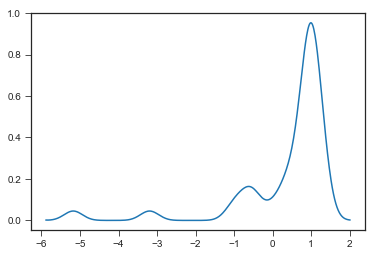

In [69]:
kde = statsmodels.nonparametric.kde.KDEUnivariate(data)
kde.fit()
plt.plot(kde.support, kde.density)
# print(kde.entropy)

/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/matplotlib/figure.py:2267: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  warnings.warn("This figure includes Axes that are not compatible "


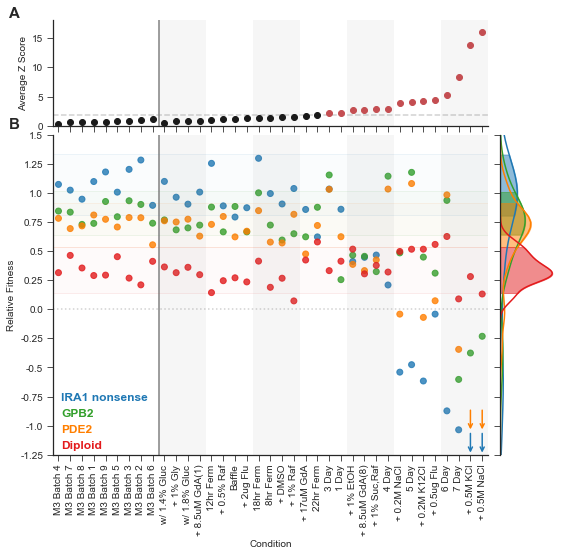

In [126]:
fig = plt.figure(figsize=(8+1,6+2))
gs = GridSpec(2, 2, width_ratios=[8, 1], height_ratios=[2, 6],hspace=0.04,wspace=0.05)

ax3 = fig.add_subplot(gs[0])
sns.despine(ax=ax3)
graphs.zscore_graph(ax3,m3_z_scores,nonm3_z_scores,sorted_m3_cols,sorted_nonm3_cols)

plt.text(s='A',x=-0.1,y=1.02,fontsize=15,fontweight='semibold',transform=ax3.transAxes)



ax1 = fig.add_subplot(gs[2])
sns.despine(ax=ax1)
gene_list = ['IRA1_nonsense','IRA1_missense','GPB2','PDE2','Diploid']
gene_list = ['IRA1_nonsense','GPB2','PDE2','Diploid']
graphs.fitness_tubes_graph(ax1,this_data,mean_std_bygene,minimal_training_bcs,minimal_testing_bcs,m3_conditions,nonm3_conditions,gene_list,side_bars=False,faded_alpha=0.8)

ymin = -1.25
ymax = 1.5

plt.text(s='B',x=-0.1,y=1.02,fontsize=15,fontweight='semibold',transform=ax1.transAxes)

ax2 = fig.add_subplot(gs[3])   
sns.despine(ax=ax2)
for gene in gene_list:
    this_gene_data = mutant_data[mutant_data['mutation_type']==gene]
    data = np.median(np.asarray([this_gene_data[col].values for col in (list(m3_conditions) + list(nonm3_conditions))]),axis=1)
#     data = np.median(np.asarray([this_gene_data[col].values for col in (list(m3_conditions))]),axis=1)


    sns.distplot(data,color=tools.mutant_colorset[gene],vertical=True,hist=False,kde_kws={'shade':False})
    
    kde = statsmodels.nonparametric.kde.KDEUnivariate(data)
    kde.fit()
    y = kde.support
    x = kde.density

    mean = mean_std_bygene[gene][0]
    twosigma_top = mean_std_bygene[gene][0]+2*mean_std_bygene[gene][1]
    twosigma_bottom = mean_std_bygene[gene][0]-2*mean_std_bygene[gene][1]
        
    x_loc_top = np.where(y<twosigma_top)[0][-1]
    x_loc_bottom = np.where(y<twosigma_bottom)[0][-1]
#     x_loc_bottom = np.where(y>twosigma_bottom)[0][0]
    x_loc_top = np.where(y>twosigma_top)[0][0]
#     sns.distplot(data,color=tools.mutant_colorset[gene],vertical=True,hist=True,kde_kws={'shade':False})

    ax2.fill_betweenx(y[x_loc_bottom:x_loc_top], 0, x[x_loc_bottom:x_loc_top],alpha=0.5,color=tools.mutant_colorset[gene])
    plt.ylim(-1.25,1.5)
    

plt.yticks(np.linspace(ymin,ymax,12),['' for i in np.linspace(ymin,ymax,12)])
ax2.xaxis.set_visible(False)
ax2.spines['bottom'].set_visible(False)

plt.tight_layout() # only off when tight layout is used - might need to annotate afterwards



plt.savefig('Figure3_working_sandbox_distribution.pdf')




In [ ]:
fig = plt.figure(figsize=(2*8,2*6+1))
gs = GridSpec(3, 2, width_ratios=[1, 1], height_ratios=[6, 1, 6],hspace=0.05)

ax1 = fig.add_subplot(gs[0])

gene_list = ['IRA1_nonsense','IRA1_missense','GPB2','PDE2','Diploid','other']
gene_list = ['IRA1_nonsense','IRA1_missense','GPB2','PDE2','Diploid']

# this_gene = ['IRA1_nonsense','IRA1_missense','GPB2','PDE2','Diploid','other']
graphs.fitness_featured_genes_figure(ax1,this_data,minimal_training_bcs,minimal_testing_bcs,m3_conditions,nonm3_conditions,gene_list,ymin=-1.25,ymax=1.5,yticknum=12)
plt.text(s='A',x=-0.1,y=1.05,fontsize=15,fontweight='semibold',transform=ax1.transAxes)

plt.xlabel('')

ax2 = fig.add_subplot(gs[1])

gene_list = ['IRA1_nonsense','IRA1_missense','GPB2','PDE2','Diploid']
graphs.fitness_tubes_graph(ax2,this_data,mean_std_bygene,minimal_training_bcs,minimal_testing_bcs,m3_conditions,nonm3_conditions,gene_list)



plt.text(s='B',x=-0.1,y=1.05,fontsize=15,fontweight='semibold',transform=ax2.transAxes)
                 
ax3 = fig.add_subplot(gs[2])

graphs.zscore_graph(ax3,m3_z_scores,nonm3_z_scores,sorted_m3_cols,sorted_nonm3_cols)

plt.savefig('Figure3_working.pdf')

# plt.tight_layout() # only off when tight layout is used - might need to annotate afterwards



In [59]:
sorted_nonm3_cols

array(['1BB_1.4%Gluc_fitness', '1BB_1%Gly_fitness',
       '1BB_1.8%Gluc_fitness', 'Geldanamycin8.5uM_fitness',
       'Ferm_44hr_Transfer_fitness', '1BB_0.5%Raf_fitness',
       '1BB_Baffle_fitness', '1BB_2ugFlu_fitness',
       'Ferm_50hr_Transfer_fitness', 'Ferm_40hr_Transfer_fitness',
       'DMSO_fitness', '1BB_1%Raf_fitness', '1BB_17uMGdA_fitness',
       'Ferm_54hr_Transfer_fitness', 'Resp_3Day_Transfer_fitness',
       'Resp_24hr_Transfer_fitness', '1BB_1%EtOH_fitness',
       '1BB_8.5uMGdA_fitness', '1BB_SucRaf_fitness',
       'Resp_4Day_Transfer_fitness', '1BB_0.2MNaCl_fitness',
       'Resp_5Day_Transfer_fitness', '1BB_0.2MKCl_fitness',
       '1BB_0.5ugFlu_fitness', 'Resp_6Day_Transfer_fitness',
       'Resp_7Day_Transfer_fitness', '1BB_0.5MKCl_fitness',
       '1BB_0.5MNaCl_fitness'], dtype='<U26')

In [77]:
m3_z_scores.shape,nonm3_z_scores[:,:14].shape

((127, 9), (127, 14))

(-0.5, 22.5)

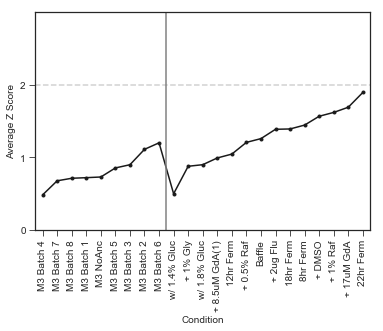

In [94]:
graphs.zscore_graph(ax3,m3_z_scores,nonm3_z_scores,sorted_m3_cols,sorted_nonm3_cols)

plt.ylim(0,3)
plt.yticks(np.arange(0,3,1),np.arange(0,3,1))
plt.xlim(-0.5,22.5)
# plt.d

# together_z_scores = m3_z_scores + nonm3_z_scores[:,:14]

In [87]:
np.mean(nonm3_z_scores,axis=0)

array([ 1.25626949,  0.49543686,  0.89647538,  4.0124647 , 15.95788173,
        4.26857095, 13.79349574,  2.78600129,  1.68947025,  1.38501887,
        4.45092449,  1.61775281,  1.20437695,  0.87480611,  2.76920736,
        2.9479126 ,  1.04284159,  1.44300886,  1.89343517,  1.38954942,
        2.26601343,  2.24415553,  2.96559884,  4.15083936,  5.26384014,
        8.32575127,  1.56491456,  0.98942821])

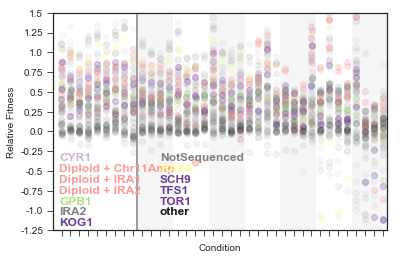

In [43]:
other_gene_list = np.unique([gene for gene in this_data['gene'].values if gene not in gene_list+['IRA1']])
fig,ax = plt.subplots()

graphs.fitness_featured_genes_figure(ax,this_data,minimal_training_bcs,minimal_testing_bcs,m3_conditions,nonm3_conditions,other_gene_list,
                                     ymin=-1.25,ymax=1.5,yticknum=12,median=False,legend=True,legend_cols=2,color_alpha=0.25,gray_alpha=0.05)



{'0': (9.079958574429009, 5), '1': (5.468658140804559, 8), '2': (9.292019691907417, 5), '3': (6.455014648955654, 8), '4': (9.461105235633324, 6), '5': (8.83189457200608, 5), '6': (11.30584220902394, 7), '7': (7.024104212906395, 6), '8': (8.273658681025202, 8), '9': (8.837427420273663, 3), '10': (9.672518769782645, 3), '11': (10.36205356227429, 5), '12': (11.07718762656414, 3), '13': (10.630223619618299, 7), '14': (11.1964487534189, 3), '15': (5.682629161003115, 6), '16': (10.731971706443709, 7), '17': (9.231901555471842, 8), '18': (8.647982056326084, 6), '19': (6.040006673827545, 7), '20': (10.890355692839197, 3), '21': (10.024041631192015, 6), '22': (7.2882391579632335, 9), '23': (6.132441877351182, 8), '24': (6.277595023220392, 8), '25': (8.12218095262852, 7), '26': (7.369831913339565, 7), '27': (7.141730301481335, 6), '28': (6.656485450721693, 7), '29': (7.385268098625872, 4), '30': (13.30671747656686, 5), '31': (10.390041411308804, 6), '32': (6.973713178222083, 7), '33': (6.1366197

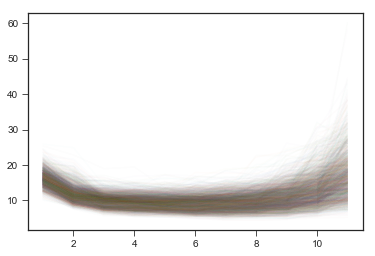

In [150]:
# %%notify

last_subtle = 13
# last_subtle = nonm3_subtle_locs[-1]+1

this_data = merged_fitness_data
this_data = this_data.replace([np.inf, -np.inf], np.nan)
this_data = this_data.dropna('columns',how='all')
this_data = this_data.dropna()
this_data = this_data.sort_values('barcode')

# this_data['batch_mean'] = np.mean(this_data[[col for col in sorted_m3_cols]].values,axis=1)

best_guesses = {}

# total = np.zeros()

cols_avail = list(sorted_m3_cols) + list(sorted_nonm3_cols[:last_subtle])


for iteration,this_set in enumerate(product([0,1],repeat=int(len(cols_avail)/2))):
    first_set =  sorted(np.random.choice(range(len(cols_avail)),int(len(cols_avail)/2),replace=False))
    second_set = [i for i in range(len(cols_avail)) if i not in first_set]
#     first_set = [i+this_set[count] for count,i in enumerate(range(0,len(cols_avail),2))]
#     second_set = [i for i in range(len(cols_avail)) if i not in first_set]
    
    cols_avail = np.asarray(cols_avail)
    
    train_cols = list(cols_avail[first_set])
    test_cols = list(cols_avail[second_set])

    fitness_cols = train_cols + test_cols

    fitness = this_data[fitness_cols].values

    n_mutants = fitness.shape[0]
    n_conditions = fitness.shape[1]

    train_conditions = train_cols
    train_locs = np.where(np.isin(fitness_cols,train_conditions))[0]

    test_conditions = test_cols
    test_locs = np.where(np.isin(fitness_cols,test_conditions))[0]

    all_locs = sorted(list(train_locs)+list(test_locs))

    used_mutants = [bc for bc in this_data['barcode'].values if bc in (list(minimal_training_bcs) + list(minimal_testing_bcs))]

    all_mut_locs =sorted(list(np.where(np.isin(this_data['barcode'].values,used_mutants))[0]))

    this_fitness = fitness[all_mut_locs,:][:,all_locs]
    new_train_locs = np.where(np.isin(all_locs,train_locs))[0]
    new_test_locs = np.where(np.isin(all_locs,test_locs))[0]  

    train = [new_train_locs,np.where(np.isin(used_mutants,minimal_training_bcs))[0]]
    test = [new_test_locs,np.where(np.isin(used_mutants,minimal_testing_bcs))[0]]

    max_rank = min([len(train[0]),len(train[1])])

    # SVD predictions with all combinations of components, in parallel
    
    output = tools.SVD_predictions_train_test(this_fitness,train,test,by_condition=True,mse=True)
#     print(output)
#     with Pool(len(train_cols)+1) as pool:
#         entries = [[this_fitness,train,test,n_components,True,False,False] for n_components in range(1,max_rank+1)]
#         output = pool.starmap(tools.SVD_predictions_train_test_mixnmatch,entries)

    sort_list = []
    guess_list = []
#     print(output[0])
    sort_list = output[0]
    
#     for o in output:
#         sort_list.append(sorted([(o1,o2,o3) for o1,o2,o3 in zip(o[0],o[3],o[1])],reverse=True))
#         guess_list.append(sorted([(o1,o2) for o1,o2 in zip(o[0],o[-1])],reverse=True))
#     for o in output:
#         sort_list.append(sorted([(o1,o2,o3) for o1,o2,o3 in zip(o[0],o[4],o[1])],reverse=True))
#         guess_list.append(sorted([(o1,o2) for o1,o2 in zip(o[0],o[-1])],reverse=True))

#     best_by_rank = [sort_list[rank][0][0] for rank in range(len(sort_list))]
    best_by_rank = output[0]
    if iteration == 0:
        total = np.asarray(best_by_rank)
    else:
        total = total + np.asarray(best_by_rank)

    plt.plot(range(1,len(best_by_rank)+1),best_by_rank,alpha=0.01)

#     best_guesses[f'{iteration}'] = (max(best_by_rank),np.where(best_by_rank==max(best_by_rank))[0][0] +1)
    best_guesses[f'{iteration}'] = (min(best_by_rank),np.where(best_by_rank==min(best_by_rank))[0][0] +1)
# plt.legend()
# plt.ylim(0,1)
# plt.plot(range(1,len(total)+1),total,color='k',alpha=0.5)
# plt.savefig('close_conditions_odd_even_ALL_CV_nomixnmatch_mse.pdf',bbox_inches='tight')

print(best_guesses)

In [127]:
# %%notify

this_data = merged_fitness_data
this_data = this_data.replace([np.inf, -np.inf], np.nan)
this_data = this_data.dropna('columns',how='all')
this_data = this_data.dropna()
this_data = this_data.sort_values('barcode')

this_data['batch_mean'] = np.mean(this_data[[col for col in sorted_m3_cols]].values,axis=1)

# last_subtle = 1

train_cols = list(sorted_m3_cols) + list(sorted_nonm3_cols[:last_subtle])
# test_cols = list(nonm3_cols[last_subtle:])+['batch_mean']

test_cols = list(sorted_nonm3_cols[last_subtle:])
# test_cols = ['batch_mean']

fitness_cols = train_cols + test_cols

fitness = this_data[fitness_cols].values

n_mutants = fitness.shape[0]
n_conditions = fitness.shape[1]

train_conditions = train_cols
train_locs = np.where(np.isin(fitness_cols,train_conditions))[0]

test_conditions = test_cols
test_locs = np.where(np.isin(fitness_cols,test_conditions))[0]

testing_bcs = minimal_testing_bcs
# testing_bcs = [bc for bc in this_data['barcode'].values if bc not in (list(minimal_training_bcs))]

all_locs = sorted(list(train_locs)+list(test_locs))

used_mutants = [bc for bc in this_data['barcode'].values if bc in (list(minimal_training_bcs) + list(testing_bcs))]

all_mut_locs =sorted(list(np.where(np.isin(this_data['barcode'].values,used_mutants))[0]))

this_fitness = fitness[all_mut_locs,:][:,all_locs]
new_train_locs = np.where(np.isin(all_locs,train_locs))[0]
new_test_locs = np.where(np.isin(all_locs,test_locs))[0]  

train = [new_train_locs,np.where(np.isin(used_mutants,minimal_training_bcs))[0]]
test = [new_test_locs,np.where(np.isin(used_mutants,testing_bcs))[0]]

train_c = train[0]
train_m = train[1]

test_c = test[0]
test_m = test[1]

both_new = this_fitness[np.repeat(test_m,len(test_c)),np.tile(test_c,len(test_m))].reshape(len(test_m),len(test_c))

all_m = sorted(list(train_m) + list(test_m))
new_cond = this_fitness[np.repeat(all_m,len(test_c)),np.tile(test_c,len(all_m))].reshape(len(all_m),len(test_c))




In [15]:
fit_by_rank, fits_by_condition, fits_by_mutant, mean_fits,mean_fits_by_condition, guesses, dhats, both_old = tools.SVD_predictions_train_test(this_fitness,train,test,by_condition=True,by_mutant=True)

1 0.8608694237858683
2 0.9142296403746536
3 0.9480781534921453
4 0.9627914325040726
5 0.9753678960659543
6 0.9847878232588019
7 0.9919767817505217
8 0.9948468350857083
9 0.9964198754657178
10 0.9977706794027573
11 0.9988851613066521
12 0.9993197383801647
13 0.9995948733512149
14 0.9997140792095194
15 0.9998238360284883
16 0.9999183649116655
17 0.9999618180857431
18 0.9999867106538213
19 1.0


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/matplotlib/axes/_axes.py:6448: UserWarning: The 'normed' kwarg is deprecated, and has been replaced by the 'density' kwarg.
  warnings.warn("The 'normed' kwarg is deprecated, and has been "


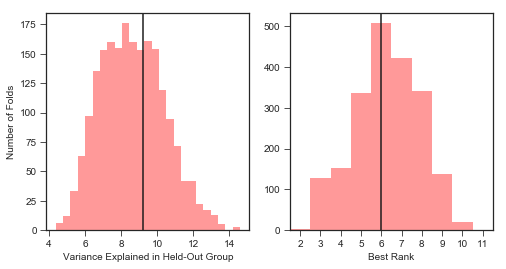

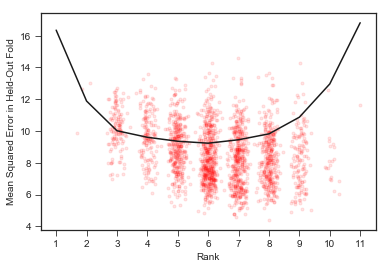

In [151]:
plt.figure(figsize=(8,4))
plt.subplot(121)
these_guesses = [item[0] for item in best_guesses.values()]
plt.axvline(min(total/len(best_guesses)),color='k')
sns.distplot(these_guesses,kde=False,color='red')
plt.xlabel('Variance Explained in Held-Out Group')
plt.ylabel('Number of Folds')
plt.subplot(122)
ranks = [item[1] for item in best_guesses.values()]
sns.distplot(ranks,kde=False,bins=np.arange(min(ranks), max(ranks) + 1),color='red')
plt.axvline(np.where(total==min(total))[0]+1.5,color='k')
plt.xlabel('Best Rank')
# plt.ylabel('Count (of 100)')

plt.xticks(np.arange(min(ranks)+0.5, max(ranks) + 1.5),np.arange(min(ranks), max(ranks)+1 ))
plt.xlim(min(ranks),max(ranks)+1)
plt.savefig('best_rank_found_ALL_randomchoices_mse.pdf',bbox_inches='tight')

plt.figure()

plt.scatter(tools.jitter_point(ranks),these_guesses,alpha=0.1,marker='.',color='red')
plt.plot(range(1,len(total)+1),total/len(best_guesses),'k',label='Average')
plt.ylabel('Mean Squared Error in Held-Out Fold')
plt.xlabel('Rank')
plt.xticks(range(1,len(total)+1),range(1,len(total)+1))

plt.savefig('bestfit_by_rank_found_ALL_randomchoices_mse.pdf',bbox_inches='tight')

In [153]:
len(best_guesses)

2048

1 0.2040066725177535
2 0.37702727754752663
3 0.4963528990856274
4 0.6015657625159366
5 0.6861459450897455
6 0.7515025323293996
7 0.8018830173879137
8 0.8430075096253383
9 0.8821812109827761
10 0.9107363742694851
11 0.9338227823699325
12 0.9546984701046188
13 0.9721502547080327
14 0.9808097242740069
15 0.989186738513954
16 0.9938061956202273
17 0.9969779050168995
18 0.9996937118487628
19 1.0
1 0.21557225520920853
2 0.3559087741053534
3 0.4779195980588763
4 0.5668264053277107
5 0.6494015746084494
6 0.717186779192321
7 0.7739679451888297
8 0.821722019379968
9 0.8625878657413479
10 0.8953169785419126
11 0.9263203643246632
12 0.9475525433396824
13 0.9671940151562556
14 0.9794365392086485
15 0.9884854288345764
16 0.9946929358149809
17 0.9977841786706325
18 0.9992982046094919
19 1.0
1 0.21892126366857056
2 0.35419352889563016
3 0.47691973672645327
4 0.5763652564993138
5 0.6668885504208744
6 0.7368428106797218
7 0.8050963574562899
8 0.8509406196366349
9 0.8888922592049313
10 0.9152365915785551

1 0.2043642535057455
2 0.3459513488300211
3 0.46763662168530973
4 0.5637869019893655
5 0.6484367690981554
6 0.729310956858147
7 0.7960584112125122
8 0.8417089822443763
9 0.878938279724159
10 0.9109850780641379
11 0.9363324425871539
12 0.953607229490985
13 0.9692714343915388
14 0.980364302439161
15 0.9898488284520331
16 0.9959681732881199
17 0.9985283873666121
18 0.9996923921638909
19 1.0
1 0.21856559368470097
2 0.3623150176512455
3 0.5045685044316255
4 0.6047952093515465
5 0.6876335901642749
6 0.7500284987405086
7 0.7995648117831216
8 0.8459003036748799
9 0.8837855752757394
10 0.9182104781102164
11 0.9484023940498264
12 0.9656304959662955
13 0.9770992064312527
14 0.9873419551564122
15 0.9939451267759607
16 0.9966570526847852
17 0.9992239506419125
18 0.9997156239860868
19 1.0
1 0.2077237491334344
2 0.377750846676442
3 0.48972447160419097
4 0.5903828089272093
5 0.6706532751387424
6 0.7388667073165874
7 0.7918314445584945
8 0.8327072006854501
9 0.8717647230437775
10 0.9036955470538728
11 

4 0.6000090646323377
5 0.687465622220167
6 0.7707320773610287
7 0.8185816606827986
8 0.8543555408622022
9 0.887062673887808
10 0.9148312323861915
11 0.9354108450954981
12 0.9534474956586154
13 0.9689142139943987
14 0.9817943916536658
15 0.9886030395089274
16 0.993541122816242
17 0.9971691370310483
18 0.9995430707868193
19 1.0
1 0.2221050517442813
2 0.3671259493275235
3 0.48781467606685047
4 0.5933257170268267
5 0.6702802315646053
6 0.7335959453501018
7 0.7825421092053406
8 0.828991441121316
9 0.8697613612220505
10 0.9047836273896062
11 0.9336474138065869
12 0.9569157027617474
13 0.971388250945743
14 0.9812434461577848
15 0.9888689558904257
16 0.9934741294134756
17 0.9965595546703664
18 0.9985797752539152
19 1.0
1 0.20778597231613827
2 0.3577419116445484
3 0.4891035141308385
4 0.5893581297407655
5 0.6725784122073678
6 0.7467477339499768
7 0.8067435294158277
8 0.8517053827992258
9 0.8867901835735309
10 0.9169000322185894
11 0.9379629544002468
12 0.9569579325101093
13 0.9752597231823599
1

19 1.0
1 0.21925580379901155
2 0.3568641926299023
3 0.4744793263816425
4 0.5675233217437281
5 0.655361505474753
6 0.725163121913653
7 0.7852480087135851
8 0.8329921070744566
9 0.8800107302449052
10 0.9121952117899774
11 0.9370756356419485
12 0.9544812542017753
13 0.9713335251344462
14 0.98161803501194
15 0.9899959652818551
16 0.994816095590905
17 0.9972897962802405
18 0.999226778115765
19 1.0
1 0.20786969276529565
2 0.4101420769903136
3 0.5216739110662069
4 0.6169570076094535
5 0.7057030948507705
6 0.7676024954051089
7 0.8200784091748883
8 0.8630781893163344
9 0.8942048675595311
10 0.9216516564038196
11 0.9417012499414147
12 0.9587894553198704
13 0.9731089988800967
14 0.9824879361872602
15 0.9894066242403956
16 0.9934073284891111
17 0.9967367280916825
18 0.9988003008897904
19 1.0
1 0.20365650847696637
2 0.35513620248933886
3 0.4760660111609444
4 0.583306548680848
5 0.6780955572508195
6 0.7457067768301577
7 0.8019761642855685
8 0.8502804285492458
9 0.8893246274945974
10 0.91565309909578

1 0.21740816090339987
2 0.3815805368914592
3 0.5078457293225009
4 0.6029523887814783
5 0.6781011725561452
6 0.7421773733736787
7 0.7982791069744393
8 0.8511761864018312
9 0.8898101699464335
10 0.9197230801722157
11 0.9457282263718627
12 0.9646170935144736
13 0.9758611455227236
14 0.9851877009929867
15 0.991533111161187
16 0.9954083110252202
17 0.9979962489020853
18 0.9993646830256839
19 1.0
1 0.20561535993836266
2 0.36384080138188213
3 0.5021915547778139
4 0.5855515672532692
5 0.65762720007128
6 0.7181675078904957
7 0.7719847879311212
8 0.8215133151620256
9 0.8649998105629987
10 0.9021013614694662
11 0.93176290648215
12 0.954261188770058
13 0.9720510875419063
14 0.9854841124047921
15 0.9921781565103345
16 0.9968690343071025
17 0.9990475379241297
18 0.9998541882329864
19 1.0
1 0.239978576005913
2 0.3841122613532244
3 0.5129100338282861
4 0.6148173603266307
5 0.6938507783932659
6 0.7495810074120572
7 0.8012666202747398
8 0.8403976934054629
9 0.8757912715658558
10 0.9083124117398047
11 0.

16 0.9961383439383216
17 0.9986396042220289
18 0.9995104773797774
19 1.0
1 0.1953515721258936
2 0.34651732696502857
3 0.4572455801635338
4 0.5514513088530926
5 0.6393241805931048
6 0.7184442841776995
7 0.7784901366569745
8 0.8304504678922384
9 0.8666275418034844
10 0.9004035333747034
11 0.9318059775675911
12 0.9535724605090891
13 0.9679518553010458
14 0.98024329230909
15 0.9874545500555539
16 0.9938120964006534
17 0.9980624177120182
18 0.9997966530333133
19 1.0
1 0.22940140892140026
2 0.3667879947985352
3 0.47718790828518287
4 0.5778516022921782
5 0.6648444294915079
6 0.7288170790082033
7 0.7862911471444397
8 0.842567396306582
9 0.8806379213450152
10 0.911986971691955
11 0.9417435292921075
12 0.9615734989650294
13 0.9729785291676252
14 0.9827867442580561
15 0.9893699189318251
16 0.9945856651989734
17 0.9976568306973989
18 0.999665792045636
19 1.0
1 0.2195818349333899
2 0.3709002048973682
3 0.4871573468158866
4 0.5847587827882226
5 0.6728395274341639
6 0.7420938110977358
7 0.79486946810

14 0.9846328409015632
15 0.9924391152411003
16 0.996247453952382
17 0.999185690357385
18 0.9997500357721533
19 1.0
1 0.19440114262581054
2 0.3339870963227064
3 0.45604765269930747
4 0.5742218795714655
5 0.6849434689757115
6 0.7531549567938249
7 0.8118850479948515
8 0.8541949781106302
9 0.8918665465147304
10 0.921700181463415
11 0.9463228191179506
12 0.9621471057599059
13 0.9774023524526843
14 0.9890251384521781
15 0.993713029666835
16 0.9968071854565157
17 0.9984467411374724
18 0.9993518349804011
19 1.0
1 0.21865582196989453
2 0.3986803388804592
3 0.5558207501367564
4 0.6437268112871762
5 0.7277876495613744
6 0.7857862428058179
7 0.8316637381070958
8 0.8691092313912827
9 0.9003252657302528
10 0.9269088453549854
11 0.948592774461294
12 0.9641521733355536
13 0.9755920543493816
14 0.9849511523411147
15 0.9932391657788527
16 0.9962240063642747
17 0.9982038430220598
18 0.9992562090578517
19 1.0
1 0.22655116488997762
2 0.3531032465960271
3 0.47013502751277836
4 0.5763062126011801
5 0.6536272

12 0.9451647225821966
13 0.96188339939462
14 0.9767748386588522
15 0.9868555845666437
16 0.9922989356157047
17 0.9970702738241495
18 0.9993195698810817
19 1.0
1 0.21502260392515915
2 0.3912697545885576
3 0.5146886871094822
4 0.6135143473147564
5 0.6907263878068531
6 0.7633878818805779
7 0.8187051948352717
8 0.8645696668330466
9 0.8969829355539498
10 0.9252223300063985
11 0.9503733424729998
12 0.9695736202267411
13 0.979507009858843
14 0.9868539388352592
15 0.9929518019904666
16 0.9963774092201235
17 0.9986819809712655
18 0.9995469465942174
19 1.0
1 0.21673544358174224
2 0.3429626745529778
3 0.4647277411059654
4 0.5700967351114118
5 0.658182422123175
6 0.7320063329088937
7 0.7993961570843517
8 0.8507273702848336
9 0.8907831643705701
10 0.9203301582045551
11 0.9446529678095638
12 0.9638051789678346
13 0.9772339306638965
14 0.9881509961140996
15 0.9929487779063264
16 0.9971064419704251
17 0.9985994541103482
18 0.9997324979666682
19 1.0
1 0.21738934174225166
2 0.357149691387859
3 0.4755888

16 0.9960939792210137
17 0.9986132645373
18 0.999851411817673
19 1.0
1 0.23122712432959236
2 0.38498986245887323
3 0.4968894442752373
4 0.5929928697769782
5 0.6799741487942548
6 0.7517892238415855
7 0.8002388992087219
8 0.8415162959689715
9 0.875260909856207
10 0.902660744102371
11 0.9255492255121255
12 0.9463404935519082
13 0.9609591795492834
14 0.9729023838930041
15 0.9841548421085615
16 0.9918235372357069
17 0.9965421671323794
18 0.9992867249588193
19 1.0
1 0.2236592097110761
2 0.36269421956947434
3 0.4939388566218741
4 0.5921255165451191
5 0.6785849868131208
6 0.7391393623893856
7 0.7874577397284921
8 0.8347360968813923
9 0.8769350277407247
10 0.906785166223856
11 0.9312584137874318
12 0.9494681583578564
13 0.9652755802285112
14 0.9788021326574815
15 0.9875250890603213
16 0.9943063396228584
17 0.9968857247673607
18 0.9988102849059224
19 1.0
1 0.22030290967914035
2 0.36575801337600633
3 0.47548901745713545
4 0.5701897649143457
5 0.6593094107411825
6 0.728863142055858
7 0.78445778531

18 0.9993876150816956
19 1.0
1 0.2386872698850916
2 0.4025212909574728
3 0.5181381151521631
4 0.6069706603159113
5 0.6840109140441312
6 0.7500519765529443
7 0.8012230727525684
8 0.8467186666393687
9 0.8869345728913035
10 0.9154182210919933
11 0.9416003345130161
12 0.9597541819226666
13 0.9738296392605362
14 0.985296877234358
15 0.9925724894716067
16 0.9962281737277043
17 0.9985771088687023
18 0.9999355910882837
19 1.0
1 0.2210779425427547
2 0.4027224439491349
3 0.5120702312036556
4 0.592784542914899
5 0.6640958141139668
6 0.7265777243215004
7 0.7824336817108545
8 0.8328661334031666
9 0.8748344350373826
10 0.907504130751577
11 0.9354042297849019
12 0.9595156203219243
13 0.9715702091621464
14 0.9811552705121946
15 0.988806090261632
16 0.9940141514682114
17 0.9971804002283016
18 0.9988524640586307
19 1.0
1 0.2111876145351127
2 0.3537457728771154
3 0.4811698095057658
4 0.5860769128343688
5 0.6802442925861096
6 0.7384295346502248
7 0.7905378387488329
8 0.8335327350249173
9 0.869150023852500

8 0.8256099716386498
9 0.8684153227822531
10 0.9017043293117736
11 0.9294163871452001
12 0.9489125887681831
13 0.9646796668386364
14 0.9795983553128331
15 0.988395059306187
16 0.9932631864262174
17 0.9971941837754549
18 0.9994369086516796
19 1.0
1 0.23084091114829142
2 0.37003716937256215
3 0.4817884934204161
4 0.5843003907140281
5 0.6603616387846207
6 0.7324743142912287
7 0.7970960231650233
8 0.8430453761156169
9 0.8778787472478037
10 0.9083422803997684
11 0.9314440208495796
12 0.9496793781824003
13 0.9658825635442982
14 0.9760251845175221
15 0.9853648480888224
16 0.9925164862007646
17 0.9960757091155884
18 0.9989834352232696
19 1.0
1 0.19332483043479143
2 0.33238654984009197
3 0.46217776315640946
4 0.5759367594075382
5 0.6659211058130711
6 0.7379755831473989
7 0.7985399276706894
8 0.8493934928951112
9 0.8868471415993405
10 0.9165628706096163
11 0.9423306330579668
12 0.9595772366094285
13 0.9749480479855347
14 0.9847038220630429
15 0.990895816744855
16 0.9958522506430721
17 0.99825254

13 0.9670998469336911
14 0.9818146525335614
15 0.9883997343662122
16 0.994572848525436
17 0.9984896708388414
18 0.9993817932893487
19 1.0
1 0.22751980293385132
2 0.3653889454541137
3 0.4787465076229592
4 0.586177834093218
5 0.6754237589247507
6 0.7464087374360906
7 0.8069089558863745
8 0.8513326463244069
9 0.8888478019220947
10 0.9157405805650807
11 0.938176474207062
12 0.9539923421517156
13 0.9686381710575607
14 0.9810645726853915
15 0.9890796522674907
16 0.9937055325783896
17 0.9971128607466343
18 0.9988596526134288
19 1.0
1 0.2075104176088397
2 0.3817668886874658
3 0.5022507229360696
4 0.6026617363054267
5 0.6907673957882186
6 0.7553998758504591
7 0.8144517846006887
8 0.8554248136228517
9 0.8886580553526616
10 0.914727682941517
11 0.9361398007012319
12 0.9548322758739662
13 0.9675167991760577
14 0.9794883428729604
15 0.9883224453179142
16 0.9938894941890175
17 0.9972464250918239
18 0.9995184543309164
19 1.0
1 0.2123057018023038
2 0.3523396873564085
3 0.4846000229720989
4 0.589035022

13 0.975650866156436
14 0.9849795472548751
15 0.9920940718202259
16 0.9958026068714818
17 0.9981977782772743
18 0.9993513404323526
19 1.0
1 0.20228850107939156
2 0.3434860657100167
3 0.4629547740055058
4 0.5658737503176148
5 0.6667695272845937
6 0.74479307676188
7 0.8099509488116324
8 0.8582687518551149
9 0.8923606465606289
10 0.9160024666039948
11 0.9368113742785366
12 0.9562189310375018
13 0.9702613866434575
14 0.9802464399516503
15 0.9888240987278607
16 0.9950330590166321
17 0.9972363135678094
18 0.9992314390532839
19 1.0
1 0.2348782462272785
2 0.3715436565821718
3 0.49021864972699636
4 0.5869410690536305
5 0.6710287535048909
6 0.7432507018478712
7 0.8135360274308936
8 0.8681992675848862
9 0.901179874936395
10 0.9255353858852526
11 0.9442094610239372
12 0.9620010657699469
13 0.9727031544977873
14 0.9828351944909989
15 0.9897742248423813
16 0.9933911173990847
17 0.9966077463954283
18 0.9984602765797871
19 1.0
1 0.23093934319569076
2 0.4052698823965709
3 0.5377206786186266
4 0.6307954

6 0.7269194442678062
7 0.7959163013323869
8 0.8460750905577228
9 0.8896954448536303
10 0.9187278900337963
11 0.9435815985137194
12 0.9614115114957911
13 0.9747129236011816
14 0.9867568368803582
15 0.9933400624892518
16 0.995786118018274
17 0.9979394236796928
18 0.9991467437639995
19 1.0
1 0.20310274325519972
2 0.33890687987027146
3 0.4603740111201401
4 0.5713481259966346
5 0.6479998685910999
6 0.7135830418141793
7 0.7770992141839919
8 0.8258053897362106
9 0.8674683937450125
10 0.9052228445245768
11 0.9322870227669211
12 0.9548851003989276
13 0.9713701517893716
14 0.9812426084843018
15 0.9899195475122613
16 0.9945936506430721
17 0.9975216192582009
18 0.9997014461964059
19 1.0
1 0.20919811838079294
2 0.33816676279204727
3 0.45299022880329765
4 0.5577787272293654
5 0.6447995157597759
6 0.7197406776439038
7 0.7799725548135246
8 0.8295490358973128
9 0.8738239155682416
10 0.9147527733063762
11 0.9394325576607944
12 0.9603530088876251
13 0.973853851373649
14 0.9835126682586292
15 0.9903532195

10 0.9194800128552615
11 0.9405399133564875
12 0.9575985582696199
13 0.9728417412970891
14 0.9806040437687568
15 0.9869193031747683
16 0.9929004721427277
17 0.9962499954646733
18 0.9991993040515332
19 1.0
1 0.2111633978983244
2 0.3452151070823989
3 0.4602601778220554
4 0.5604148988458885
5 0.6493299029164006
6 0.7248700052586425
7 0.7922564255383329
8 0.8488454515203994
9 0.880813627863346
10 0.9056710990680471
11 0.9301805913209455
12 0.9501680822297691
13 0.9674332264417331
14 0.9795935181419312
15 0.9886235370240302
16 0.9937402783436456
17 0.9980690353457019
18 0.9998228232110505
19 1.0
1 0.22161495849420143
2 0.3704970908349614
3 0.5073959651369278
4 0.612306546799124
5 0.688978454198699
6 0.7456286188332499
7 0.801883497885127
8 0.8460104618104294
9 0.8853530342410926
10 0.9208520198445296
11 0.9446303116451367
12 0.9649821334850994
13 0.9790910476306243
14 0.9886564738279647
15 0.9938168437403577
16 0.9959690168529283
17 0.9979598195343855
18 0.9994492179793526
19 1.0
1 0.205139

14 0.9793363694000337
15 0.9867402038229487
16 0.993187267680674
17 0.997600163684587
18 0.9991563929083856
19 1.0
1 0.21769162389039576
2 0.3880512504125134
3 0.4851301090225587
4 0.5690043368583017
5 0.6464551341296012
6 0.7038448654839127
7 0.7574333408256562
8 0.8064231234667241
9 0.8485499936098018
10 0.8866746169265388
11 0.9155535662498773
12 0.9369577888257123
13 0.9549803791630359
14 0.9695506855693491
15 0.9825811409490312
16 0.9904661534794349
17 0.9957626563265547
18 0.998969502861032
19 1.0
1 0.20356627629290647
2 0.3628534438813118
3 0.48407483708671317
4 0.5809761953535975
5 0.6629413856610555
6 0.7358377886225038
7 0.7983618332285036
8 0.8410299325020422
9 0.879345703267872
10 0.9100156682635643
11 0.93367003139506
12 0.9509507766122177
13 0.9672676006912946
14 0.9777403939142704
15 0.9858518425444601
16 0.992169955245811
17 0.9960445545830583
18 0.9989225132092171
19 1.0
1 0.22156302540227224
2 0.38043357672530853
3 0.4973427525975199
4 0.597501403957697
5 0.6748670991

1 0.21363482021317204
2 0.4019442231263559
3 0.5094899744658905
4 0.6025307470928547
5 0.6793466430821407
6 0.7393666810765791
7 0.795400943907363
8 0.8420293618236021
9 0.8794241580756228
10 0.9144132504800893
11 0.9424207329403984
12 0.9622381882522414
13 0.9748350704546136
14 0.9845949518939137
15 0.9916283044685127
16 0.9954846392358137
17 0.9983271995245553
18 0.9994253363364195
19 1.0
1 0.21467983534995239
2 0.35231815717284587
3 0.46455134567365486
4 0.5646933289602651
5 0.6458145002170667
6 0.7186708117585457
7 0.7758816645958988
8 0.8257672045893966
9 0.8648874533665757
10 0.8993067279234555
11 0.9301137026059203
12 0.9479376284540993
13 0.9646751498325976
14 0.9779628603723468
15 0.9858413119162044
16 0.9917953424725983
17 0.9967909468068168
18 0.9991362474951467
19 1.0
1 0.2095772780993883
2 0.3850751326875749
3 0.5206845926935734
4 0.623281548434409
5 0.6949013145139149
6 0.7636900312335547
7 0.8139352108037519
8 0.8546952336724715
9 0.8939635295137577
10 0.9260745342515404

1 0.20956133833255408
2 0.36663282281155707
3 0.48782812831835576
4 0.5846411964213521
5 0.66579600324072
6 0.728496322105228
7 0.7855924661786329
8 0.8301775792253452
9 0.868122742668654
10 0.9002911738319881
11 0.9288324795896115
12 0.9523238582533295
13 0.9673126778239287
14 0.9812087876428469
15 0.9919293826510458
16 0.9962249310622102
17 0.9981400928542787
18 0.9996371498204577
19 1.0
1 0.21346889190438756
2 0.3479328123637201
3 0.470588852500314
4 0.5586956458702708
5 0.6390377629704352
6 0.714991592884789
7 0.7854101489870937
8 0.841447802216015
9 0.8726330698715179
10 0.9007646480051481
11 0.9261787454490372
12 0.9484811275010997
13 0.9648440573515582
14 0.9798598032888204
15 0.989653510413625
16 0.994156450120082
17 0.9975633801769512
18 0.9993586198688517
19 1.0
1 0.21853285832065128
2 0.35653529356571745
3 0.4532630888014203
4 0.5474594331738354
5 0.6369379670075258
6 0.7095947805729104
7 0.7734185802107147
8 0.8268787223865808
9 0.86807074506423
10 0.90196385841635
11 0.928

1 0.23935571207193818
2 0.40677192926842776
3 0.511740398917737
4 0.5936351483824125
5 0.6653407130967101
6 0.7326732174831853
7 0.7917007121520862
8 0.8341376040080113
9 0.8752377224947976
10 0.9052028096869817
11 0.9341651806351686
12 0.9555392156378658
13 0.968974738386376
14 0.9796558691896502
15 0.9883045992407438
16 0.9943381981361417
17 0.9975438147857755
18 0.9992634460817067
19 1.0
1 0.21465463877883617
2 0.3791830089257745
3 0.4914320686962499
4 0.5764323605734488
5 0.6504278713311268
6 0.719039804818357
7 0.7783772353745907
8 0.8316881523064092
9 0.8744093460380299
10 0.9069962473854305
11 0.9359285137571778
12 0.953636792703816
13 0.9675746926360368
14 0.9789656372884188
15 0.9882748407383303
16 0.994495294296102
17 0.9970747613486817
18 0.999168555238179
19 1.0
1 0.2417808807334655
2 0.3979936838011725
3 0.5103003818540053
4 0.6060047587271027
5 0.6866665712117535
6 0.7524549481250831
7 0.801354719934256
8 0.844249458454685
9 0.883448469217045
10 0.9216211971479528
11 0.94

15 0.992690624995292
16 0.9973578000105944
17 0.9991628221074108
18 0.9997695393301232
19 1.0
1 0.21367209414378618
2 0.3802255557555201
3 0.4954814339548187
4 0.5699740859939404
5 0.6390099853510485
6 0.6978735633511082
7 0.755905843268041
8 0.8100513306383287
9 0.856513343926637
10 0.8982873908012792
11 0.9283668581704976
12 0.9523612610661397
13 0.9687410226010081
14 0.9804732440734991
15 0.9883070907366492
16 0.9936917735361677
17 0.9972763493314967
18 0.9993278948261941
19 1.0
1 0.23948211505295025
2 0.3877959689075754
3 0.49608630757947825
4 0.5818323649104759
5 0.6574569238615126
6 0.7240691412153406
7 0.7837046635699547
8 0.8348706174354927
9 0.8769150081615686
10 0.90940627390602
11 0.9373000640362666
12 0.9586151086033411
13 0.9739287688838107
14 0.9859653079172815
15 0.9934325127907335
16 0.9972103867685052
17 0.9990412030587662
18 0.9995503894864406
19 1.0
1 0.21806993667298447
2 0.37412094804530616
3 0.48731643051192686
4 0.585724014463868
5 0.6736858750550375
6 0.73764018

8 0.8467255822043712
9 0.8828822441025684
10 0.9173344592648293
11 0.9402073179615877
12 0.958691241497944
13 0.9721242856420964
14 0.983570586619936
15 0.9895644749075211
16 0.9942163822429163
17 0.9975910039918374
18 0.9997173900091411
19 1.0
1 0.21435164555772146
2 0.35196963896390554
3 0.4647692433520553
4 0.5686306512730978
5 0.6483274374611419
6 0.7213750764396283
7 0.7828401393852404
8 0.837873216416646
9 0.8784914600612773
10 0.9127552845890703
11 0.9446350854940393
12 0.9668143523569227
13 0.9766751578429629
14 0.9857086316756446
15 0.9928976641931537
16 0.996959374775593
17 0.9990001361974137
18 0.9997041375807336
19 1.0
1 0.22915387583691693
2 0.3740685446102803
3 0.4890233368016792
4 0.5903045887571376
5 0.6756380547590523
6 0.7373267972489641
7 0.7899533384401503
8 0.8382053958006204
9 0.873376076003285
10 0.9045752540560906
11 0.9274938799355567
12 0.9474116505407782
13 0.9649952293045145
14 0.9790328680092621
15 0.9876489765546967
16 0.9954833124880774
17 0.9990212233524

8 0.8101589012643855
9 0.8540216768598211
10 0.8935014845984622
11 0.919144799505995
12 0.9393064529957942
13 0.9568988150398515
14 0.9707759157025369
15 0.9824156507315875
16 0.990908001956179
17 0.9954092431021022
18 0.9987945148106132
19 1.0
1 0.24524735247677354
2 0.38397732242991967
3 0.501896956474428
4 0.5915907679908934
5 0.6675900701294298
6 0.7401722452878452
7 0.7964670597042607
8 0.8437214549540188
9 0.8836610189133557
10 0.9197401266196317
11 0.9491212977164984
12 0.9670554756724028
13 0.9805605548612842
14 0.988055658385401
15 0.9927571212174372
16 0.996557277609409
17 0.9989747723068371
18 0.9998069565198682
19 1.0
1 0.2335350140077187
2 0.36097800085920084
3 0.4782424440530558
4 0.5720953520043165
5 0.6600861405110579
6 0.7301839191748687
7 0.7976826796081193
8 0.8386747725907331
9 0.8757911749796174
10 0.9112193032420649
11 0.936286301236825
12 0.9534325116409281
13 0.9675229754399847
14 0.9793260593495698
15 0.9883078096422564
16 0.9938346536552086
17 0.99695663605377

5 0.6990442408846378
6 0.7559783002460237
7 0.8071730221247744
8 0.8505803873765247
9 0.8864530078642235
10 0.9146607007653236
11 0.9369351701858817
12 0.9549845105928684
13 0.9684642511181282
14 0.9794206214634213
15 0.9877164572275907
16 0.9931581967979322
17 0.9975486016506
18 0.9989970955994273
19 1.0
1 0.20959293535948775
2 0.3674238374974965
3 0.4978472445620774
4 0.5854100996537488
5 0.6619995153577551
6 0.7336383062422178
7 0.7947852040954757
8 0.8409097895680011
9 0.8801743103241426
10 0.9106622193034755
11 0.9333688199052619
12 0.9512624055852946
13 0.9661430123130065
14 0.9797623930266104
15 0.9896225637922331
16 0.9948853763689154
17 0.998671275031521
18 0.9999294530844655
19 1.0
1 0.20726762154783562
2 0.3673922209585204
3 0.4815327466810555
4 0.5848882792441799
5 0.6717214642861221
6 0.7433770804822112
7 0.7959051883144638
8 0.8441879862776094
9 0.8844396745571134
10 0.913476334074688
11 0.9353163190857819
12 0.9537417377568298
13 0.9711226537082895
14 0.9825467627925686


5 0.665986849932668
6 0.7394677791088389
7 0.8001385616087229
8 0.8449389587559406
9 0.8791350400349551
10 0.9095140923576036
11 0.9358256591143322
12 0.9566194028778647
13 0.9699173333732096
14 0.9826027269793195
15 0.9894396928153923
16 0.9951412164034575
17 0.9981126636543666
18 0.9995917286607107
19 1.0
1 0.21447604140252485
2 0.35111636745420827
3 0.46321514594554125
4 0.5634723029364919
5 0.6610619812964529
6 0.7295580302497615
7 0.7932206711800063
8 0.8365439020809338
9 0.8692725265369646
10 0.8998325436471225
11 0.9228274231006693
12 0.9432524964814948
13 0.9596376621678774
14 0.9728333526567216
15 0.9828095179825679
16 0.9901597552749367
17 0.9961013666546613
18 0.9997397007162636
19 1.0
1 0.2216851609058662
2 0.37667394958125844
3 0.5061469219908443
4 0.5963134657626084
5 0.6821557872833937
6 0.7470950835025231
7 0.7963998887712598
8 0.842335567497871
9 0.8808994697524619
10 0.9092393537479146
11 0.9351325942514337
12 0.957558791086801
13 0.9732861877018035
14 0.9827484347533

9 0.8877042585655492
10 0.9199580942820983
11 0.9410207634052656
12 0.9593992512122733
13 0.9745823883578609
14 0.9853167200964316
15 0.992208111534769
16 0.9964012651750539
17 0.9985831470774267
18 0.9998632585960624
19 1.0
1 0.20833500534465232
2 0.35170914321975677
3 0.4753925209564036
4 0.5816585567982537
5 0.6747588043257475
6 0.7466518081657674
7 0.8074001008262127
8 0.8615633375464932
9 0.9029252931583408
10 0.9266666050668175
11 0.9477653621244582
12 0.9620733016824022
13 0.9730094167191534
14 0.981524816518368
15 0.9898060591991527
16 0.9944477207866153
17 0.9974833038635467
18 0.999628597471819
19 1.0
1 0.21715700242285874
2 0.3674587766893207
3 0.49122569944790007
4 0.5919631962888068
5 0.6705295875930622
6 0.7362747853428577
7 0.7823055976847875
8 0.8250436343043002
9 0.8621503107050356
10 0.8935224921231713
11 0.9195367440531209
12 0.943883338826414
13 0.9635355798601468
14 0.9794302660394099
15 0.9884121882810544
16 0.9945058524907673
17 0.9978079997571878
18 0.9995302673

2 0.34454017592057107
3 0.4798671316555928
4 0.5820273131575477
5 0.6611208836566767
6 0.7285602792452275
7 0.7805944432441403
8 0.8302098249937887
9 0.8703760640925673
10 0.9054609883516266
11 0.9322419233351471
12 0.9534289479297944
13 0.9672762794523888
14 0.9764096870110753
15 0.9843851606618272
16 0.9913395656077431
17 0.9957806789770992
18 0.9990081230940908
19 1.0
1 0.22441406208353043
2 0.35390774285029003
3 0.468469464694133
4 0.5542588327457134
5 0.6327659326341823
6 0.7079673997252425
7 0.7692679965547974
8 0.8157154356331118
9 0.8551826715020084
10 0.8886347554659799
11 0.9189182162345615
12 0.9424682193466949
13 0.9629985443685922
14 0.9768372443429502
15 0.9878126068945164
16 0.994982793700535
17 0.9975284736351897
18 0.9990235003078188
19 1.0
1 0.22051718795190134
2 0.3763450913774863
3 0.49273514694616516
4 0.5986087139892284
5 0.6733616624519186
6 0.7337774178292686
7 0.7938206131944257
8 0.8383273457350743
9 0.8782076940043346
10 0.9176859934949001
11 0.94361716588624

16 0.9946434662993396
17 0.9980020232373391
18 0.9995566839308565
19 1.0
1 0.20293749673605666
2 0.37493549229708234
3 0.5077953250676899
4 0.5969439718584356
5 0.6789533778053843
6 0.7472347525028211
7 0.8101020949755935
8 0.8509329635957521
9 0.8811453698812767
10 0.908905962142014
11 0.9354816221705385
12 0.9595919283392755
13 0.9756892221743408
14 0.9850848059737961
15 0.9905028628014371
16 0.9938117887986018
17 0.9965776085738252
18 0.9988929936103519
19 1.0
1 0.2384133044955643
2 0.3918950247471351
3 0.5138321932993064
4 0.6048658046003978
5 0.6928896749190743
6 0.7650372405872607
7 0.8229109443427272
8 0.8663523265602858
9 0.8987798317417884
10 0.9265498243911705
11 0.9490229703515748
12 0.9646795273659976
13 0.9779063944479421
14 0.9867383408726494
15 0.993340567951488
16 0.9968804127450916
17 0.9993582206346867
18 0.99990477362956
19 1.0
1 0.22796168180052712
2 0.3785590410645058
3 0.48122594107964123
4 0.5702259655796499
5 0.6538826200738845
6 0.7329996822186053
7 0.795193095

2 0.3869857678731604
3 0.5132460273124619
4 0.5978036452953261
5 0.6745402350926237
6 0.7470007980391893
7 0.7993456305872829
8 0.8422736332212817
9 0.87457734921498
10 0.9053801488901313
11 0.9330962703090157
12 0.9516672019377017
13 0.9679670749278322
14 0.9800064815700138
15 0.9879924954431971
16 0.9931892213792701
17 0.9963522815906396
18 0.9987262306369186
19 1.0
1 0.23497643319837913
2 0.3882027159241126
3 0.5167016144067982
4 0.6200434719784262
5 0.6978333715438109
6 0.7703493554155956
7 0.8184593566300545
8 0.8563546891388819
9 0.8868929061620747
10 0.914520327327603
11 0.9402573660561749
12 0.9608701618716898
13 0.9768346436030729
14 0.9851540935914572
15 0.9896159818831963
16 0.9933785305498752
17 0.9968190493827125
18 0.9993576030386688
19 1.0
1 0.2068876378191855
2 0.3885652441348735
3 0.515759153508758
4 0.6188384557668367
5 0.7014507473579144
6 0.766083918069908
7 0.8131416235227968
8 0.8527477554057062
9 0.8891641467336076
10 0.9232483982749269
11 0.9485179647314628
12 0

5 0.6667844307806983
6 0.7362335829028817
7 0.7989992837351756
8 0.8470725467723024
9 0.8813610941945214
10 0.9086265745104151
11 0.9346371791753543
12 0.9573810269514917
13 0.9730760600795595
14 0.9808084023385313
15 0.9876873107735278
16 0.9940923917163744
17 0.9973091497501831
18 0.9994595154028909
19 1.0
1 0.21215378477802105
2 0.36009786162060253
3 0.47954586753547346
4 0.5706602003020198
5 0.6531503963895964
6 0.7240580777505783
7 0.785374558900141
8 0.8344271295037429
9 0.8727335462806886
10 0.9013636176528823
11 0.9265267120502102
12 0.948413384154359
13 0.9640706590385807
14 0.9769065668108654
15 0.9861812129214459
16 0.9921193865852272
17 0.9961868105129653
18 0.9994662851952504
19 1.0
1 0.2068532517477486
2 0.3642888912155674
3 0.49807487282415874
4 0.5957284319898781
5 0.6751835754149563
6 0.7408681013130525
7 0.7955286724547128
8 0.8390109186984593
9 0.8783583005593019
10 0.9092258088404712
11 0.9321266862085231
12 0.9516004565974764
13 0.9657196060739449
14 0.979074529412

9 0.8808348839033465
10 0.9100018407565101
11 0.933461264315461
12 0.9529815312971732
13 0.9706420089580095
14 0.9813491369539048
15 0.9884797974748107
16 0.9947782950741457
17 0.9983609901236363
18 0.9993699476996492
19 1.0
1 0.23154632623663907
2 0.3597824711028077
3 0.47463705458884276
4 0.5781889616186662
5 0.6555437216068818
6 0.7259652527265493
7 0.7786537465321021
8 0.8271040181686588
9 0.8701499200754408
10 0.9026961232373765
11 0.931177956830444
12 0.9534476571889837
13 0.9713064133495689
14 0.9838217442501425
15 0.9919130915321491
16 0.9957751579171251
17 0.9979276822979344
18 0.9996418241540656
19 1.0
1 0.2332127459994482
2 0.3704209464513528
3 0.4836020388301404
4 0.5938490280455249
5 0.6696019993837734
6 0.7417364221251191
7 0.8010959122930957
8 0.8475966221043687
9 0.8914826835385511
10 0.9248701152942194
11 0.9456836168565711
12 0.9619836585534659
13 0.9726648326829321
14 0.981012739215029
15 0.9881046535541539
16 0.993234456232567
17 0.9969351112394708
18 0.999190378879

17 0.9974015103647024
18 0.9989876017439013
19 1.0
1 0.19978844873830826
2 0.3689886313525851
3 0.5236408827673512
4 0.6032362540899115
5 0.6805719868023177
6 0.7487123343139914
7 0.8026755522104716
8 0.8466560658303467
9 0.8752255516252697
10 0.9025391045086556
11 0.9260830163397126
12 0.9470925332123346
13 0.9653201117347957
14 0.9786675310196926
15 0.9863083446171613
16 0.9921418907175115
17 0.9962262871729725
18 0.9981387515715008
19 1.0
1 0.23237027796403165
2 0.3653149168237605
3 0.494953126784369
4 0.590681363425115
5 0.6568099302453223
6 0.7185604618673938
7 0.7773517908689023
8 0.8271589657089667
9 0.8639231406263295
10 0.8961937836452605
11 0.9262595032724852
12 0.9521932543256512
13 0.9659643182347787
14 0.9780723555710831
15 0.986774228927023
16 0.9928621702573883
17 0.9973577213812783
18 0.9992992088326729
19 1.0
1 0.23945062172060272
2 0.371159144966951
3 0.47758262364318926
4 0.5775511945103657
5 0.6624907014911439
6 0.7333520229837789
7 0.801188643152606
8 0.84383047251

11 0.9334450402120767
12 0.9556169253410169
13 0.9677575822811638
14 0.9787206402641555
15 0.9884632303147437
16 0.9940528622256088
17 0.9976197055198445
18 0.9997782579774098
19 1.0
1 0.2064355772432479
2 0.3727767024718115
3 0.51574786098412
4 0.6075602371437644
5 0.6813029393622339
6 0.7495288892260623
7 0.8085739840230048
8 0.8556880808606311
9 0.8938954849177421
10 0.9221917248303795
11 0.9471215703331775
12 0.9654791703225883
13 0.9785051965310263
14 0.987050813342794
15 0.9945112731793946
16 0.9972279775807509
17 0.9987006067401833
18 0.9998285678774802
19 1.0
1 0.2073923895336951
2 0.3664279346310443
3 0.49471983986029977
4 0.6036699549375955
5 0.6861466015014316
6 0.7622218308061501
7 0.8170724044986308
8 0.8539126505481274
9 0.8888814680193959
10 0.9192350182469408
11 0.9438188635388485
12 0.9617922166814261
13 0.974209386940536
14 0.982962265085025
15 0.989293439278088
16 0.9951376703264667
17 0.9978776196219465
18 0.9993505236399874
19 1.0
1 0.21920168011509622
2 0.38086108

1 0.1959470708792691
2 0.3403612387887005
3 0.4603491776410751
4 0.5649105555025041
5 0.6473626894366055
6 0.7117952489975679
7 0.7718830650194286
8 0.8259247721454865
9 0.8673988903326126
10 0.9003821848401363
11 0.9290572709782534
12 0.9506354590896776
13 0.9649044707413105
14 0.9775058752110919
15 0.9879364217352234
16 0.9947222907595452
17 0.9983737467489381
18 0.9996267705960022
19 1.0
1 0.2273551657508328
2 0.40859572910669884
3 0.5288287986780108
4 0.6169487326354686
5 0.6880188960499345
6 0.7488984114005901
7 0.8030725756227944
8 0.8556532458981683
9 0.8853559156466044
10 0.9136088312853736
11 0.9376721762966376
12 0.9555603044936405
13 0.9702225798833335
14 0.9802798419848053
15 0.9882139813799748
16 0.9938886428975671
17 0.9983136178601182
18 0.9996336221524021
19 1.0
1 0.2068878249963767
2 0.35002284259475047
3 0.4712809269331386
4 0.5711468455230775
5 0.6585586217405889
6 0.7349368374518133
7 0.7874727236422471
8 0.8367802071451671
9 0.8799673859588772
10 0.9106297925216245

7 0.8058326241340255
8 0.8519456957951196
9 0.8919166753857781
10 0.9192950001538824
11 0.9416602010283335
12 0.9604465012322074
13 0.9760121602738074
14 0.9843466858209107
15 0.9901424291412566
16 0.9946365958858995
17 0.9971966729935849
18 0.9994753942278037
19 1.0
1 0.21854537049921474
2 0.3687350643419156
3 0.497032282725826
4 0.5946723524116544
5 0.6828870311887343
6 0.7421121502324917
7 0.7974924258927625
8 0.8448371970251098
9 0.8821950649762427
10 0.9154072152963041
11 0.9404458405422301
12 0.9618697258362637
13 0.9754330155656615
14 0.9845759222445862
15 0.990952504951215
16 0.9948372498688373
17 0.9981816811700891
18 0.9994827771040621
19 1.0
1 0.21201531268501905
2 0.3664802854550654
3 0.4961432568659888
4 0.5985152495229231
5 0.6806857346472228
6 0.7516918065484524
7 0.8081471914082237
8 0.8500195126543817
9 0.8878387684227346
10 0.9155340268621965
11 0.9402630922178563
12 0.961970234838248
13 0.9767554362206246
14 0.9845503066019315
15 0.9898875138208174
16 0.9937843513848

8 0.844030789053561
9 0.8866150706075362
10 0.910962872716196
11 0.934435549484622
12 0.9519167674111453
13 0.9672093714582658
14 0.9800315844580585
15 0.9887632188030488
16 0.9942186722322592
17 0.9978516964311109
18 0.9991415085170592
19 1.0
1 0.23600162315595952
2 0.4010942915004566
3 0.5261567159197671
4 0.6092566886156725
5 0.6868044180905406
6 0.7531465515156299
7 0.8122001921472016
8 0.85870696451407
9 0.899015354919324
10 0.9254945156081097
11 0.9491679804386582
12 0.9648285406433781
13 0.9757316471840521
14 0.9831903562570804
15 0.9891060556308832
16 0.993580961209332
17 0.9976612148004774
18 0.9992057888433848
19 1.0
1 0.21246549434540307
2 0.35158628967194105
3 0.47830998019862636
4 0.589416260355131
5 0.6832301531876612
6 0.7478687183471915
7 0.8013294458871993
8 0.8524481212938991
9 0.8904310407065986
10 0.9214966173430177
11 0.9492574029274392
12 0.9649036618890927
13 0.9762146019310181
14 0.9841057795274848
15 0.9910788331456561
16 0.9948662658548384
17 0.997521320448742

15 0.9877950861894542
16 0.9952574904758983
17 0.9977782821465091
18 0.9992423546088712
19 1.0
1 0.20247656755550092
2 0.3545321018216998
3 0.4907980166120376
4 0.5865278816484796
5 0.6685296290973849
6 0.7457602307718638
7 0.8011684268795777
8 0.8447899851628332
9 0.8811391844523785
10 0.9116421289578214
11 0.934678954397029
12 0.954445544957805
13 0.9687814284453812
14 0.9807559641534283
15 0.9878979427756317
16 0.9937099058065221
17 0.9964525648535912
18 0.9988104878103228
19 1.0
1 0.22398719166612613
2 0.3822121109745391
3 0.5042938691122051
4 0.6046549614965359
5 0.6980510428831066
6 0.7637074176874311
7 0.8152804883762366
8 0.8572265969424351
9 0.8909897033797003
10 0.9194446811761443
11 0.943746710368513
12 0.9591903181703355
13 0.9727565575148751
14 0.9816717332864398
15 0.9896783315622228
16 0.9938709368180862
17 0.9975043308788538
18 0.9989065376823456
19 1.0
1 0.2138717585597978
2 0.3862607593224856
3 0.5276346713903526
4 0.6235106501880628
5 0.6891666731386916
6 0.743865224

14 0.9834439705194044
15 0.9898045284101425
16 0.9945909317212842
17 0.9975821244338998
18 0.9998664488051037
19 1.0
1 0.20122708815973367
2 0.34696067293534827
3 0.46756032191898045
4 0.5745837101879301
5 0.6567531197822083
6 0.7256494366888252
7 0.7832771112919362
8 0.8369135056582319
9 0.8846312946940367
10 0.920368000110086
11 0.9456864900618732
12 0.9618890982364621
13 0.9752711018748008
14 0.983944862473938
15 0.9900945744152831
16 0.9958285712171709
17 0.9981936969973855
18 0.9992470514230009
19 1.0
1 0.22575866287170898
2 0.3601040289173072
3 0.47638109068481016
4 0.5706979167292052
5 0.6564574651341832
6 0.7290670934154776
7 0.7872232773328892
8 0.8325647471567615
9 0.8682954784715241
10 0.9021518389798456
11 0.92877144577868
12 0.9489904347482097
13 0.9661383429735362
14 0.978965318275858
15 0.9878629787874948
16 0.9939619272077049
17 0.9971670021464317
18 0.9994953612618566
19 1.0
1 0.21457514247003906
2 0.353259655869949
3 0.4842666797073928
4 0.5934305649340306
5 0.6764440

1 0.22019346178416566
2 0.39182580865332584
3 0.5096728117984233
4 0.6031511215215295
5 0.6947349671751843
6 0.7505579286037088
7 0.7988522761011755
8 0.844296392655036
9 0.8811287304688802
10 0.9155834535570853
11 0.9381636115509463
12 0.9536173782922149
13 0.9677893990656687
14 0.9798267122834932
15 0.9880469387067409
16 0.9942253893572447
17 0.9975298627601153
18 0.9993697030573576
19 1.0
1 0.22891269396612246
2 0.3759438764604497
3 0.510342305645399
4 0.6089637948327642
5 0.6828242079046598
6 0.7442957425568297
7 0.7961610174367609
8 0.8385559113886516
9 0.8801501787363336
10 0.9094651184778184
11 0.932947178359592
12 0.9542888923857865
13 0.9662284905521774
14 0.9774230780514009
15 0.9862690713127533
16 0.993904836758776
17 0.9984107165780997
18 0.9998001515372356
19 1.0
1 0.2219189092076519
2 0.39467035137396067
3 0.5192743002347555
4 0.6199863067011246
5 0.693887630604463
6 0.7645516990932062
7 0.8175568260348811
8 0.863602802702095
9 0.9025173028698307
10 0.9320250359638118
11 

1 0.2181038737003127
2 0.3721104043234794
3 0.4889955155559158
4 0.5837258018995506
5 0.6719343731666432
6 0.7438983240387569
7 0.8109037979362158
8 0.8612363280685155
9 0.8999225075714257
10 0.9251624535098901
11 0.9425995659560444
12 0.9576102700435255
13 0.968849837564128
14 0.979639323497822
15 0.988634553067443
16 0.9936300498632019
17 0.9975335113191687
18 0.9996303241432272
19 1.0
1 0.20269422583966945
2 0.3644970755907394
3 0.4851755639497922
4 0.5897424155850597
5 0.6674770560903649
6 0.7327861621211473
7 0.7880889952524166
8 0.8416102699333817
9 0.8792387717230373
10 0.9102095090165334
11 0.9360628306526381
12 0.9563807099877116
13 0.9736828091476203
14 0.9844984983258354
15 0.9902952428191042
16 0.9948063772236815
17 0.9978160850649397
18 0.9996217481519735
19 1.0
1 0.22291080682958164
2 0.38128512554440075
3 0.5079103036809314
4 0.5925538725909059
5 0.6682194604717984
6 0.7250921429009978
7 0.7764420120296978
8 0.8226834801394701
9 0.8602162157048704
10 0.8914767520654696
1

1 0.20811566616456456
2 0.360178675844291
3 0.4637387228096497
4 0.563626190575852
5 0.6460892961257223
6 0.7139582019201669
7 0.7777758318036393
8 0.8308208339221275
9 0.8740021399558515
10 0.9135099784970176
11 0.9402554441672375
12 0.956715035686632
13 0.9691992158101698
14 0.979467265884172
15 0.9881103387290157
16 0.9938511677330839
17 0.9971732874816319
18 0.9992304553367092
19 1.0
1 0.24417809970581783
2 0.3898346683181506
3 0.5064732507526493
4 0.5929942566333001
5 0.6752757718421972
6 0.7378557533552739
7 0.7922174730657499
8 0.8383115310993499
9 0.8745583343174542
10 0.9052651079764339
11 0.9296627882375101
12 0.948472029449624
13 0.9630119545284381
14 0.9757585600236095
15 0.986565306210127
16 0.9928996279754951
17 0.9965248982866002
18 0.9988074270068541
19 1.0
1 0.21981076974553038
2 0.35520690178706715
3 0.47071267658027105
4 0.5721985629503372
5 0.6582903696053819
6 0.7318489037225882
7 0.7931979070058011
8 0.8419592145520035
9 0.8786607168666757
10 0.913871113842526
11 

9 0.8777337797261524
10 0.9100754303170939
11 0.934995386161511
12 0.9528794596339707
13 0.9669988200090495
14 0.978749992603972
15 0.9895816265678522
16 0.9946415148866795
17 0.9982002084905581
18 0.9995611027058259
19 1.0
1 0.22268550213160976
2 0.3984103832144288
3 0.555282335814439
4 0.6532698838552449
5 0.7316960364566272
6 0.7892692789466179
7 0.8364083888373933
8 0.8721436305477016
9 0.9051918168581171
10 0.9297752794692072
11 0.9498187730630073
12 0.9643805539694739
13 0.9766623042883333
14 0.9851074792356783
15 0.9914818088901362
16 0.9958176968318792
17 0.998170529861336
18 0.9996052742816732
19 1.0
1 0.23046338011235945
2 0.389945672921465
3 0.5006207928976941
4 0.5891432289998608
5 0.6598148009109724
6 0.7247438461958806
7 0.7780119513502973
8 0.8265543403212543
9 0.8669604795230418
10 0.8989995104509908
11 0.9257864302150914
12 0.9443213148694718
13 0.9610704296886488
14 0.9736666380785439
15 0.9835546528598377
16 0.9905739788736543
17 0.9950872232650319
18 0.9986603976001

13 0.9656958447787145
14 0.978279284909629
15 0.9875208985322372
16 0.9953918023509725
17 0.9984922783252831
18 0.9998222711620751
19 1.0
1 0.21147594718848506
2 0.3471837310797471
3 0.4666421759447392
4 0.5654643110808362
5 0.6519417358851936
6 0.726185194698677
7 0.7784561510789274
8 0.8291848656713584
9 0.8668741035380276
10 0.9002323004110908
11 0.9285863766481448
12 0.9497299935024703
13 0.9642963738434
14 0.9777543838131177
15 0.990654961334908
16 0.9969914266612697
17 0.999046512752695
18 0.9998485754728874
19 1.0
1 0.2302389349088555
2 0.36007159691979607
3 0.47590125124535365
4 0.5753699732432523
5 0.6635380445867318
6 0.7337058638708005
7 0.7854728639774174
8 0.8321914340426415
9 0.8671306853162654
10 0.8928506873639068
11 0.9182536057509538
12 0.9394984163234065
13 0.9578684616612302
14 0.9721276037663065
15 0.9832378370836566
16 0.9931866507523849
17 0.9976631535779295
18 0.999230011820243
19 1.0
1 0.2171192294959342
2 0.3545548067677007
3 0.4759464059777532
4 0.58280964994

15 0.9914786834983874
16 0.9963321300786617
17 0.9987482539620129
18 0.9999347384711057
19 1.0
1 0.2172129667434175
2 0.36971180409218485
3 0.47999102846848496
4 0.587509175844636
5 0.6899723876191651
6 0.7528237720120876
7 0.8065622711553423
8 0.8452860309640289
9 0.8828923575619165
10 0.914014679253942
11 0.9359477797802459
12 0.953189203013207
13 0.9689487647144649
14 0.9808091576570895
15 0.9896453709739995
16 0.9952696110003104
17 0.9981540558532467
18 0.9993964721950874
19 1.0
1 0.22804695156555865
2 0.3846145757912144
3 0.48974142942754484
4 0.5765724329530513
5 0.658279503427555
6 0.7219484621908688
7 0.7836453046348658
8 0.8349730992698703
9 0.8727496685227217
10 0.9038713012827799
11 0.930707555654917
12 0.9533633724725804
13 0.9702444770812686
14 0.9830733368064603
15 0.9901979103191474
16 0.9952165887373781
17 0.9979100176839693
18 0.9995171525915165
19 1.0
1 0.20608816891227033
2 0.3775328720818679
3 0.48624370911102055
4 0.5859037053456386
5 0.6681053756377464
6 0.7367928

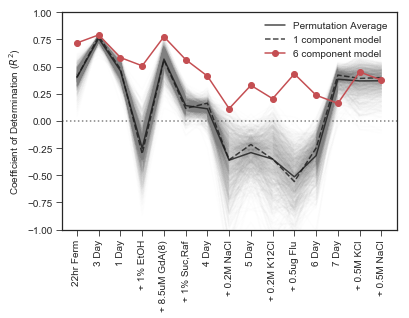

In [16]:
plt.figure()

plt.axhline(0,color='gray',linestyle=':')

perms = np.zeros(both_new.shape[1])

n_perms = 1000
for i in range(n_perms):
    perm_out = tools.SVD_predictions_train_test(this_fitness,train,test,by_condition=True,permuted_conditions=True)
    perm = np.asarray([tools.var_explained(both_new[:,i],perm_out[5][5][:,i])[0] for i in range(both_new.shape[1])])
    perms = perms + perm
    plt.plot(perm,color='gray',alpha=0.01)
plt.plot((perms/n_perms),color='k',alpha=0.8,label='Permutation Average')

dumb = np.asarray([tools.var_explained(both_new[:,i],guesses[0][:,i])[0] for i in range(both_new.shape[1])])
plt.plot(dumb,color='k',linestyle='--',alpha=0.8,label='1 component model')


colors=['r','b','g','m','orange']
for m,model in enumerate(range(5,6)):
    this_sse = np.asarray([tools.var_explained(both_new[:,i],guesses[model][:,i])[0] for i in range(both_new.shape[1])])
    
    plt.plot(this_sse,'o-',label=f'{model+1} component model',color='r',alpha=1.0)
    
# for i in range(100):
#     perm_out = tools.SVD_predictions_train_test(this_fitness,train,test,by_condition=True,permuted_mutants=True)
#     perm = np.asarray([tools.sum_squared_error(perm_out[5][5][:,i],both_new[:,i]) for i in range(both_new.shape[1])])
#     plt.plot((dumb - perm)/(dumb - min_sse),color='orange',linestyle='--')

plt.ylabel(r'Coefficient of Determination ($R^2$)')

plt.xticks(range(len(test_conditions)),[renamed_conditions[col.replace('_fitness','')] for col in test_conditions],rotation=90)
plt.legend()

plt.ylim(-1.0,1.0)

plt.savefig('far_predictions_VE_alltestBC.pdf',bbox_inches='tight')

In [47]:
[(i+1,tools.var_explained(both_old,dhats[i])[0]) for i in range(len(dhats))]

[(1, 0.8608694237858683),
 (2, 0.9142296403746536),
 (3, 0.9480781534921453),
 (4, 0.9627914325040726),
 (5, 0.9753678960659543),
 (6, 0.9847878232588019),
 (7, 0.9919767817505217),
 (8, 0.9948468350857083),
 (9, 0.9964198754657178),
 (10, 0.9977706794027573),
 (11, 0.9988851613066521),
 (12, 0.9993197383801647),
 (13, 0.9995948733512149),
 (14, 0.9997140792095194),
 (15, 0.9998238360284883),
 (16, 0.9999183649116655),
 (17, 0.9999618180857431),
 (18, 0.9999867106538213),
 (19, 1.0)]

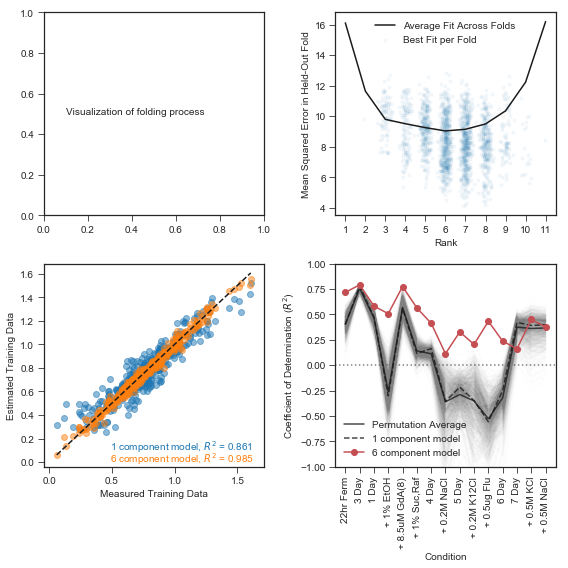

In [51]:
##### these_guesses= guesses
plt.figure(figsize=(8,8))

ax1 = plt.subplot(221)

plt.text(s='Visualization of folding process',x=0.1,y=0.5)


ax2 = plt.subplot(222)

plt.scatter(tools.jitter_point(ranks),these_guesses,alpha=0.04,marker='.',label='Best Fit per Fold')
plt.plot(range(1,len(total)+1),total/len(best_guesses),'k',label='Average Fit Across Folds')
plt.ylabel('Mean Squared Error in Held-Out Fold')
plt.xlabel('Rank')
plt.xticks(range(1,len(total)+1),range(1,len(total)+1))
plt.legend()

model = 5
model = np.where(total==min(total))[0][0]

ax3 = plt.subplot(223)

# plt.text(s='Visualization of Subtle predicting far',x=0.1,y=0.5)
plt.scatter(both_old,dhats[0],alpha=0.5,label='1 component model')
plt.scatter(both_old,dhats[model],alpha=0.5,label=f'{model + 1} component model')
plt.xlabel('Measured Training Data')
plt.ylabel('Estimated Training Data')
this_min = min([np.min(both_old),np.min(dhats[model])])
this_max = max([np.max(both_old),np.max(dhats[model])])
plt.plot([this_min,this_max],[this_min,this_max],'k--')
plt.annotate(fr'1 component model, $R^2$ = {tools.var_explained(both_old,dhats[0])[0]:.3g}',xy=(0.3*this_max,0.1),
             color=sns.color_palette()[0],transform=ax3.transAxes)
plt.annotate(fr'{model+1} component model, $R^2$ = {tools.var_explained(both_old,dhats[model])[0]:.3g}',xy=(0.3*this_max,0.0),
             color=sns.color_palette()[1],transform=ax3.transAxes)
# plt.legend()

ax4 = plt.subplot(224)

graphs.largescale_predictions_graph(ax4,this_fitness,train,test,both_new,guesses,model,test_conditions)

plt.xlabel('Condition')

plt.tight_layout()

plt.savefig('Figure4_working_testBC_withC.pdf',bbox_inches='tight')

In [130]:
# test_mutant_data = this_data[~this_data['barcode'].isin(minimal_training_bcs)]

interesting_behavior = {}
interesting_zscores = {}


mutant_data = this_data[this_data['barcode'].isin((list(minimal_training_bcs)+list(minimal_testing_bcs)))]

m3_conditions = sorted_m3_cols
nonm3_conditions = sorted_nonm3_cols


# this_gene = ['GPB2','IRA1','PDE2','Diploid']
this_gene = ['IRA1_nonsense','IRA1_missense','GPB2','PDE2','Diploid']
this_gene_data = mutant_data[mutant_data['mutation_type'].isin(this_gene)]


this_gene_locs = np.where(np.isin(mutant_data['barcode'].values,this_gene_data['barcode'].values))[0]
jitters = [tools.jitter_point(0,0.01) for bc in range(len(this_gene_data[m3_conditions[0]].values)) ]


all_conditions = list(m3_conditions) + list(nonm3_conditions)


for g,gene in enumerate(this_gene):
    interesting_behavior[gene] = []
    interesting_zscores[gene] = []
    mean = mean_std_bygene[gene][0]
    twosigma_top = mean_std_bygene[gene][0]+2*mean_std_bygene[gene][1]
    twosigma_bottom = mean_std_bygene[gene][0]-2*mean_std_bygene[gene][1]

    this_gene_data = mutant_data[mutant_data['mutation_type']==gene]
    data = np.median(np.asarray([this_gene_data[col].values for col in all_conditions]),axis=1)
    
    for i,condition in enumerate(all_conditions):
        if not twosigma_bottom < data[i] < twosigma_top:
            interesting_behavior[gene].append(condition)
            interesting_zscores[gene].append((condition,data[i]))
            

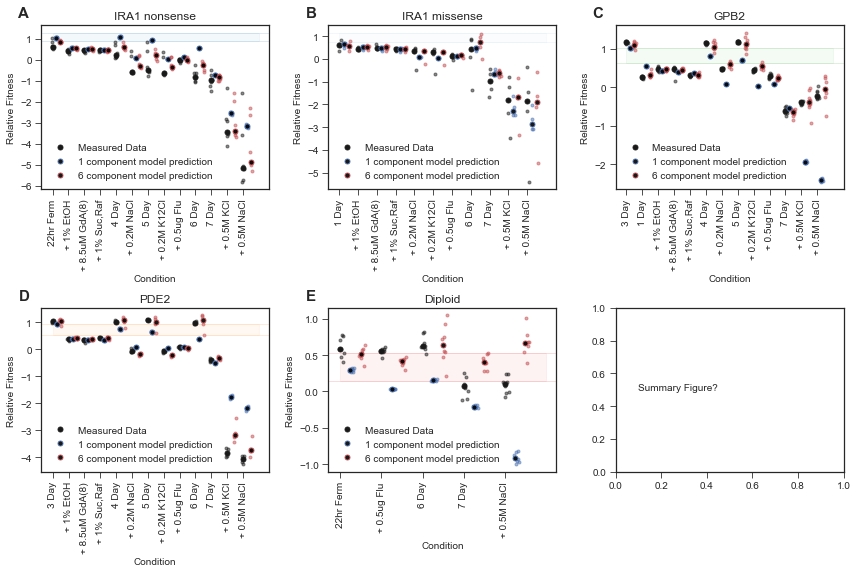

In [131]:
train_c = train[0]
train_m = train[1]

test_c = test[0]
test_m = test[1]

model_colors = ['b','r','g']

both_new = this_fitness[np.repeat(test_m,len(test_c)),np.tile(test_c,len(test_m))].reshape(len(test_m),len(test_c))

plt.figure(figsize=(3*4,2*4))

for g,(this_gene,these_conditions) in enumerate(interesting_behavior.items()):
    
    this_gene_data = this_data[this_data['mutation_type'] == this_gene]

    prediction_conditions = [condition for condition in these_conditions if condition in test_conditions]
    
    this_gene_locs = np.where(np.isin(minimal_testing_bcs,this_gene_data['barcode'].values))[0]
    this_condition_locs = np.where(np.isin(test_conditions,prediction_conditions))
    
    
    
    ax = plt.subplot(2,3,g+1)
    
    ### tube stuff
    mean = mean_std_bygene[this_gene][0]
    twosigma_top = mean_std_bygene[this_gene][0]+2*mean_std_bygene[gene][1]
    twosigma_bottom = mean_std_bygene[this_gene][0]-2*mean_std_bygene[gene][1]

    # print(gene,twosigma_bottom,twosigma_top,twosigma_top-twosigma_bottom)
    diff = twosigma_top - twosigma_bottom


    plt.axhline(twosigma_top,color=mutant_colorset[this_gene],linewidth=1.0,alpha=0.15)
    plt.axhline(twosigma_bottom,color=mutant_colorset[this_gene],linewidth=1.0,alpha=0.15)
    rect = matplotlib.patches.Rectangle((0,twosigma_bottom),len(prediction_conditions),twosigma_top-twosigma_bottom,
                                        linewidth=1,edgecolor=mutant_colorset[this_gene],facecolor=mutant_colorset[this_gene],alpha=0.05)

    ax.add_patch(rect)

    ### end tube stuff

    
    plt.title(this_gene.replace('_',' '))
    truth = both_new[this_gene_locs,:][:,this_condition_locs]
    truth = truth.reshape(truth.shape[0],truth.shape[2])
    
    jitter_list = []
    for bc in range(truth.shape[0]):
        jitter_list.append(tools.jitter_point(0,0.05))
    
    plt.plot(np.arange(0,len(prediction_conditions)),np.median(truth,axis=0),'o',markersize=5,color='k',alpha=0.9,markerfacecolor='None',label='Measured Data')
    for bc in range(truth.shape[0]):
        this_jitter = jitter_list[bc]
        plt.plot(np.arange(0+this_jitter,len(prediction_conditions)+this_jitter),truth[bc,:],'.',color='k',alpha=0.5)

    for m,model in enumerate([0,5]):
        guess = guesses[model][this_gene_locs,:][:,this_condition_locs]
        guess = guess.reshape(guess.shape[0],guess.shape[2])
        for bc in range(truth.shape[0]):
            this_jitter = jitter_list[bc]
            plt.plot(np.arange((m+1)*0.25+this_jitter,len(prediction_conditions)+(m+1)*0.25+this_jitter),guess[bc,:],'.',color=model_colors[m],alpha=0.5)
        plt.plot(np.arange((m+1)*0.25,len(prediction_conditions)+(m+1)*0.25),np.median(guess,axis=0),'o',markersize=5,color=model_colors[m],alpha=0.9,markerfacecolor='None',label=f'{model+1} component model prediction')

 

    plt.xticks(range(len(prediction_conditions)),[renamed_conditions[col.replace('_fitness','')] for col in prediction_conditions],rotation=90)
    plt.legend()
    plt.xlabel('Condition')
    plt.ylabel('Relative Fitness')
    
    plt.text(s=f'{chr(65+g)}',x=-0.1,y=1.05,fontweight='semibold',fontsize=15,transform=plt.gca().transAxes)
plt.tight_layout()

plt.subplot(2,3,6)
plt.text(s='Summary Figure?',x=0.1,y=0.5)
# for g,(this_gene,these_zs) in enumerate(interesting_zscores.items()):


    
plt.savefig('Figure5_working_tubes_alltestBC.pdf',bbox_inches='tight')

Text(0.5,0,'| Z score | ')

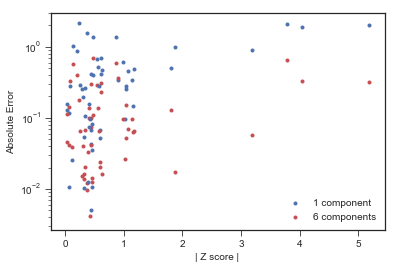

In [188]:
z_list = []
list_1 = []
list_6 = []
for g,(this_gene,cond_z_tuple) in enumerate(interesting_zscores.items()):
    
    this_gene_data = this_data[this_data['mutation_type'] == this_gene]

#     these_conditions = interesting_behavior[this_gene]

    prediction_conditions = [c for (c,z) in cond_z_tuple if c in test_conditions]
    these_zs = [z for (c,z) in cond_z_tuple if c in prediction_conditions]
    
    
    this_gene_locs = np.where(np.isin(minimal_testing_bcs,this_gene_data['barcode'].values))[0]
    this_condition_locs = np.where(np.isin(test_conditions,prediction_conditions))
    
#     these_zs = np.asarray(these_zs)[this_condition_locs[0]]
    
    truth = both_new[this_gene_locs,:][:,this_condition_locs]
    truth = truth.reshape(truth.shape[0],truth.shape[2])
    median_truth = np.median(truth,axis=0)
    z_list = z_list + list(np.abs(these_zs))
    
    for m,model in enumerate([0,5]):
        guess = guesses[model][this_gene_locs,:][:,this_condition_locs]
        guess = guess.reshape(guess.shape[0],guess.shape[2])
        median_guess = np.median(guess,axis=0)
        error = np.abs((median_guess-median_truth)/median_truth)
        error = np.abs((median_guess-median_truth))
        
        if m == 0:
            list_1 += list(error)
        else:
            list_6 += list(error)
            

        plt.scatter(np.abs(these_zs),error,marker='.',color=model_colors[m])
        

plt.yscale('log')
plt.ylabel('Absolute Error')
plt.legend(['1 component','6 components'])
plt.xlabel('| Z score | ')



In [133]:
locations = 




model = 1

fit, train_muts, test_muts, train_cond, test_cond = tools.SVD_mixnmatch_locations(this_fitness,train,test,range(model))
all_muts1 = np.concatenate((train_muts,test_muts))
all_muts1 = all_muts1[np.argsort(np.concatenate((train[1],test[1])))]

distances_1 = distance.pdist(all_muts1)
distances_1cb = distance.pdist(all_muts1,'cityblock')

mean_batch_fitness = this_data['batch_mean'].values[all_mut_locs].reshape((len(all_mut_locs),1))
distances_fitness = distance.pdist(mean_batch_fitness,'minkowski',p=1)

model = 6

fit, train_muts, test_muts, train_cond, test_cond = tools.SVD_mixnmatch_locations(this_fitness,train,test,range(6))
all_muts6 = np.concatenate((train_muts,test_muts))
all_muts6 = all_muts6[np.argsort(np.concatenate((train[1],test[1])))]

distances_6 = distance.pdist(all_muts6)
distances_6cb = distance.pdist(all_muts6,'cityblock')


0.48741993052454424
0.5575600043020864


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/scipy/linalg/basic.py:1226: RuntimeWarning: internal gelsd driver lwork query error, required iwork dimension not returned. This is likely the result of LAPACK bug 0038, fixed in LAPACK 3.2.2 (released July 21, 2010). Falling back to 'gelss' driver.
  warnings.warn(mesg, RuntimeWarning)


In [134]:
geom_medians6= {}
geom_medians1= {}
fitness_median = {}

avg_pairwise6= {}
avg_pairwise6cb= {}
avg_pairwise1= {}
avg_pairwise_fitness = {}

distance_from_median_stats = {}
distances_from_median = {}
distances_from_mediancb = {}


gene_list = ['GPB2','PDE2','IRA1','Diploid']
gene_list = ['IRA1_nonsense','IRA1_missense','GPB2','PDE2','Diploid']

for gene in gene_list:
    these_locs = np.where(np.isin(used_mutants,this_data[this_data['mutation_type']==gene]['barcode'].values))
    print(gene,len(these_locs[0]))
    geom_medians6[gene] = tools.geometric_median(all_muts6[these_locs,:][0])
    geom_medians1[gene] = tools.geometric_median(all_muts1[these_locs,:][0])
    f_data = this_data[this_data['mutation_type']==gene]['batch_mean'].values
    fitness_median[gene] = np.median(f_data)
    
    avg_pairwise6[gene] = np.mean(distance.pdist(all_muts6[these_locs,:][0]))
    avg_pairwise6cb[gene] = np.mean(distance.pdist(all_muts6[these_locs,:][0],'cityblock'))
    avg_pairwise1[gene] = np.mean(distance.pdist(all_muts1[these_locs,:][0]))
    avg_pairwise_fitness[gene] = np.mean(distance.pdist(f_data.reshape((len(f_data),1)),'minkowski',p=1))
    
    distances_from_median[gene] = []
    distances_from_mediancb[gene] = []
    for loc in these_locs[0]:
        distances_from_median[gene].append(distance.euclidean(all_muts6[loc,:][0],geom_medians6[gene]))
        distances_from_mediancb[gene].append(distance.cityblock(all_muts6[loc,:][0],geom_medians6[gene]))

    
    distance_from_median_stats[gene] = {'mean':np.mean(distances_from_median[gene]),
                                        'std':np.std(distances_from_median[gene]),
                                       'median':np.median(distances_from_median[gene]),
                                       'max':np.max(distances_from_median[gene]),
                                       'min':np.min(distances_from_median[gene]),}
    



IRA1_nonsense 11
IRA1_missense 6
GPB2 12
PDE2 7
Diploid 9


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/matplotlib/axes/_axes.py:6448: UserWarning: The 'normed' kwarg is deprecated, and has been replaced by the 'density' kwarg.
  warnings.warn("The 'normed' kwarg is deprecated, and has been "


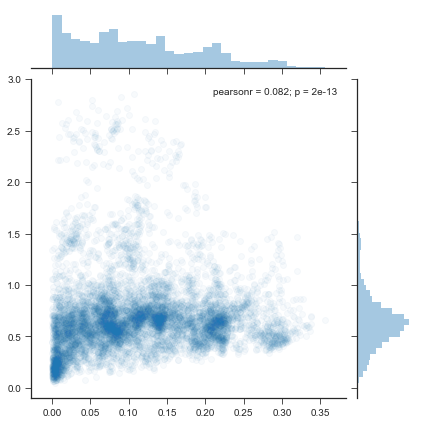

<Figure size 432x288 with 0 Axes>

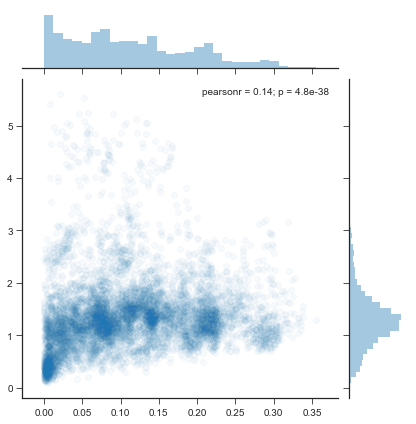

<Figure size 432x288 with 0 Axes>

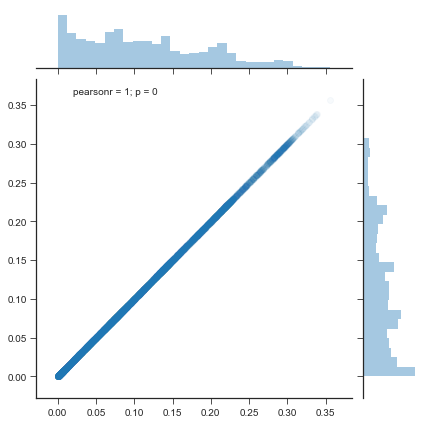

<Figure size 432x288 with 0 Axes>

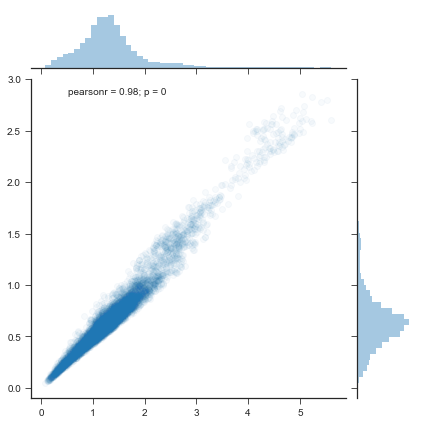

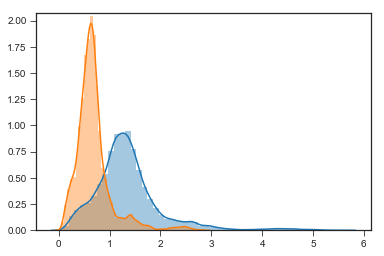

In [254]:
sns.jointplot(distances_1,distances_6,alpha=0.03)
plt.figure()
sns.jointplot(distances_1cb,distances_6cb,alpha=0.03)
plt.figure()
sns.jointplot(distances_1cb,distances_1,alpha=0.03)
plt.figure()
sns.jointplot(distances_6cb,distances_6,alpha=0.03)
plt.figure()
sns.distplot(distances_6cb)
sns.distplot(distances_6)

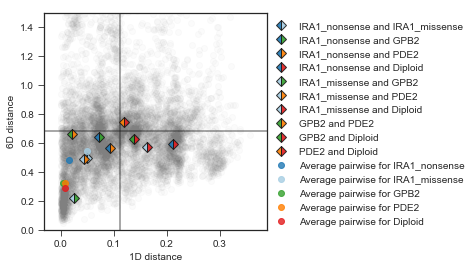

In [138]:
plt.figure(figsize=(4,4))

mean1 = np.mean(distances_1)
mean6 = np.mean(distances_6)



plt.scatter(distances_1,distances_6,alpha=0.03,color='gray')
# plt.scatter(distances_1/mean1,distances_6/mean6,alpha=0.03,color='gray')
# plt.scatter(mean1,mean6,alpha=0.8,color='k',marker='o')
plt.axvline(np.mean(distances_1),color='k',alpha=0.5)
plt.axhline(np.mean(distances_6),color='k',alpha=0.5)

# g = sns.jointplot(distances_1,distances_6,alpha=0.03,color='k')
plt.xlabel('1D distance')
plt.ylabel('6D distance')



with sns.color_palette("pastel"):
    for gene1, gene2 in combinations(gene_list,2):
        plt.plot(distance.euclidean(geom_medians1[gene1],geom_medians1[gene2]),
                    distance.euclidean(geom_medians6[gene1],geom_medians6[gene2]),
                    label=f'{gene1} and {gene2}',color=tools.mutant_colorset[gene1],marker='D',fillstyle = 'left',
                markerfacecoloralt=tools.mutant_colorset[gene2],linestyle='',markersize=7,markeredgecolor='k',alpha=0.9)

        
#         plt.plot(distance.euclidean(geom_medians1[gene1],geom_medians1[gene2])/mean1,
#                     distance.euclidean(geom_medians6[gene1],geom_medians6[gene2])/mean6,
#                     label=f'{gene1} and {gene2}',color=tools.mutant_colorset[gene1],marker='D',fillstyle = 'left',
#                 markerfacecoloralt=tools.mutant_colorset[gene2],linestyle='',markersize=7,markeredgecolor='k',alpha=0.9)
    for gene in gene_list:
        plt.plot(avg_pairwise1[gene],avg_pairwise6[gene],marker='o',linestyle='',color=tools.mutant_colorset[gene],alpha=0.8,label=f'Average pairwise for {gene}')

plt.ylim(0,1.5)
plt.legend(loc=(1.0,0.0))
# plt.savefig('1d_v_6d_distance_alltestBC.pdf',bbox_inches='tight')

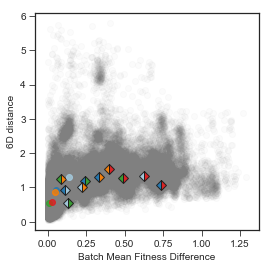

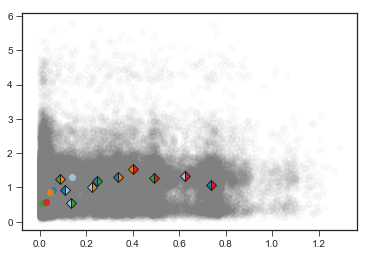

In [439]:
plt.figure(figsize=(4,4))

mean1 = np.mean(distances_fitness)
mean6 = np.mean(distances_6)



plt.scatter(distances_fitness,distances_6cb,alpha=0.03,color='gray')
# plt.scatter(distances_1/mean1,distances_6/mean6,alpha=0.03,color='gray')
# plt.scatter(mean1,mean6,alpha=0.8,color='k',marker='o')

# g = sns.jointplot(distances_1,distances_6,alpha=0.03,color='k')
plt.xlabel('Batch Mean Fitness Difference')
plt.ylabel('6D distance')



with sns.color_palette("pastel"):
    for gene1, gene2 in combinations(gene_list,2):
        plt.plot(distance.minkowski(fitness_median[gene1],fitness_median[gene2],1),
                    distance.cityblock(geom_medians6[gene1],geom_medians6[gene2]),
                    label=f'{gene1} and {gene2}',color=tools.mutant_colorset[gene1],marker='D',fillstyle = 'left',
                markerfacecoloralt=tools.mutant_colorset[gene2],linestyle='',markersize=7,markeredgecolor='k',alpha=0.9)
    for gene in gene_list:
        plt.plot(avg_pairwise_fitness[gene],avg_pairwise6cb[gene],marker='o',linestyle='',color=tools.mutant_colorset[gene],alpha=0.8,label=f'Average pairwise for {gene}')

plt.figure()
plt.scatter(np.random.permutation(distances_fitness),np.random.permutation(distances_6cb),alpha=0.03,color='gray')
with sns.color_palette("pastel"):
    for gene1, gene2 in combinations(gene_list,2):
        plt.plot(distance.minkowski(fitness_median[gene1],fitness_median[gene2],1),
                    distance.cityblock(geom_medians6[gene1],geom_medians6[gene2]),
                    label=f'{gene1} and {gene2}',color=tools.mutant_colorset[gene1],marker='D',fillstyle = 'left',
                markerfacecoloralt=tools.mutant_colorset[gene2],linestyle='',markersize=7,markeredgecolor='k',alpha=0.9)
    for gene in gene_list:
        plt.plot(avg_pairwise_fitness[gene],avg_pairwise6cb[gene],marker='o',linestyle='',color=tools.mutant_colorset[gene],alpha=0.8,label=f'Average pairwise for {gene}')






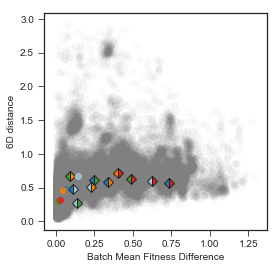

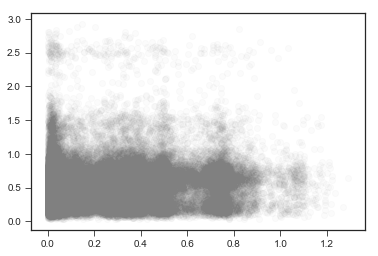

In [440]:
plt.figure(figsize=(4,4))

mean1 = np.mean(distances_fitness)
mean6 = np.mean(distances_6)



plt.scatter(distances_fitness,distances_6,alpha=0.03,color='gray')
# plt.scatter(distances_1/mean1,distances_6/mean6,alpha=0.03,color='gray')
# plt.scatter(mean1,mean6,alpha=0.8,color='k',marker='o')

# g = sns.jointplot(distances_1,distances_6,alpha=0.03,color='k')
plt.xlabel('Batch Mean Fitness Difference')
plt.ylabel('6D distance')



with sns.color_palette("pastel"):
    for gene1, gene2 in combinations(gene_list,2):
        plt.plot(distance.minkowski(fitness_median[gene1],fitness_median[gene2],1),
                    distance.euclidean(geom_medians6[gene1],geom_medians6[gene2]),
                    label=f'{gene1} and {gene2}',color=tools.mutant_colorset[gene1],marker='D',fillstyle = 'left',
                markerfacecoloralt=tools.mutant_colorset[gene2],linestyle='',markersize=7,markeredgecolor='k',alpha=0.9)
    for gene in gene_list:
        plt.plot(avg_pairwise_fitness[gene],avg_pairwise6[gene],marker='o',linestyle='',color=tools.mutant_colorset[gene],alpha=0.8,label=f'Average pairwise for {gene}')

plt.figure()
plt.scatter(np.random.permutation(distances_fitness),np.random.permutation(distances_6),alpha=0.03,color='gray')




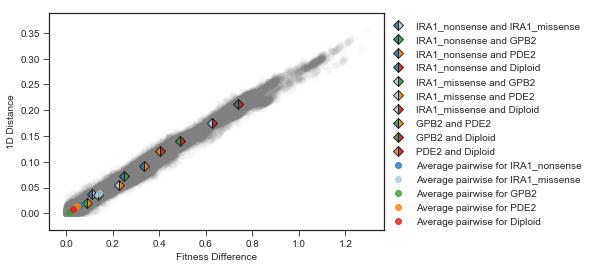

In [441]:
plt.scatter(distances_fitness,distances_1,alpha=0.03,color='gray')

with sns.color_palette("pastel"):
    for gene1, gene2 in combinations(gene_list,2):
        plt.plot(distance.minkowski(fitness_median[gene1],fitness_median[gene2],1),
                    distance.euclidean(geom_medians1[gene1],geom_medians1[gene2]),
                    label=f'{gene1} and {gene2}',color=tools.mutant_colorset[gene1],marker='D',fillstyle = 'left',
                markerfacecoloralt=tools.mutant_colorset[gene2],linestyle='',markersize=7,markeredgecolor='k',alpha=0.9)
    for gene in gene_list:
        plt.plot(avg_pairwise_fitness[gene],avg_pairwise1[gene],marker='o',linestyle='',color=tools.mutant_colorset[gene],alpha=0.8,label=f'Average pairwise for {gene}')
plt.xlabel('Fitness Difference')
plt.ylabel('1D Distance')
plt.legend(loc=(1.0,0.0))
plt.savefig('1d_distance_fitness_diff_correlation_alltestBC.pdf',bbox_inches='tight')




In [373]:
far_cond_fitness_corr = distance.squareform(np.corrcoef(new_cond),checks=False)



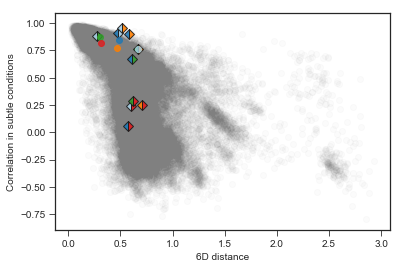

In [442]:
all_cond_fitness_corr = distance.squareform(np.corrcoef(this_fitness[:,:len(train_conditions)]),checks=False)

plt.scatter(distances_6,all_cond_fitness_corr,alpha=0.03,color='gray')
for gene1, gene2 in combinations(gene_list,2):
    gene1_traj = np.median(this_data[this_data['mutation_type']==gene1][train_conditions + test_conditions].values,axis=0)
    gene2_traj = np.median(this_data[this_data['mutation_type']==gene2][train_conditions + test_conditions].values,axis=0)
        
    plt.plot(
        distance.euclidean(geom_medians6[gene1],geom_medians6[gene2]),
        np.corrcoef(gene1_traj,gene2_traj)[0][1],     
                label=f'{gene1} and {gene2}',color=tools.mutant_colorset[gene1],marker='D',fillstyle = 'left',
            markerfacecoloralt=tools.mutant_colorset[gene2],linestyle='',markersize=7,markeredgecolor='k',alpha=0.9)

    
for gene in gene_list:
    avg_corr = np.mean(distance.squareform(np.corrcoef(this_data[this_data['mutation_type']==gene][train_conditions].values),checks=False))

    plt.plot(avg_pairwise6[gene],avg_corr,marker='o',linestyle='',color=tools.mutant_colorset[gene],alpha=0.8,label=f'Average pairwise for {gene}')

plt.xlabel('6D distance')
plt.ylabel('Correlation in subtle conditions')

plt.savefig('6D vs subtle correlation_alltestBC.pdf',bbox_inches='tight')

Text(0,0.5,'Correlation in far conditions')

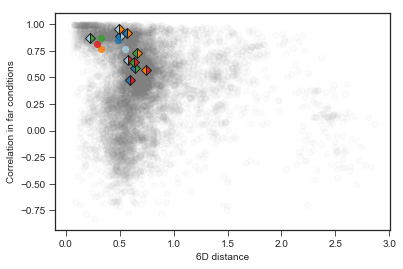

In [407]:
plt.scatter(distances_6,far_cond_fitness_corr,alpha=0.03,color='gray')
for gene1, gene2 in combinations(gene_list,2):
    gene1_traj = np.median(this_data[this_data['mutation_type']==gene1][test_conditions].values,axis=0)
    gene2_traj = np.median(this_data[this_data['mutation_type']==gene2][test_conditions].values,axis=0)
        
    plt.plot(
        distance.euclidean(geom_medians6[gene1],geom_medians6[gene2]),
        np.corrcoef(gene1_traj,gene2_traj)[0][1],     
                label=f'{gene1} and {gene2}',color=tools.mutant_colorset[gene1],marker='D',fillstyle = 'left',
            markerfacecoloralt=tools.mutant_colorset[gene2],linestyle='',markersize=7,markeredgecolor='k',alpha=0.9)

    
for gene in gene_list:
    avg_corr = np.mean(distance.squareform(np.corrcoef(this_data[this_data['mutation_type']==gene][train_conditions].values),checks=False))

    plt.plot(avg_pairwise6[gene],avg_corr,marker='o',linestyle='',color=tools.mutant_colorset[gene],alpha=0.8,label=f'Average pairwise for {gene}')

plt.xlabel('6D distance')
plt.ylabel('Correlation in far conditions')

    barcode  gene              type   ploidy class  \
35     3675  IRA1  missense_variant  Haploid   PKA   

                                 additional_muts  13.1_error  13.1_fitness  \
35  PHR1-missense_variant; POP1-missense_variant    0.059427      1.053632   

    13.2_error  13.2_fitness     ...      1BB_0.5%Raf_fitness  \
35    0.059419      1.062422     ...                 0.752396   

    1BB_0.5%Raf_error  1BB_1%Gly_fitness  1BB_1%Gly_error  1BB_1%EtOH_fitness  \
35           0.016908           0.793079          0.02357            0.497779   

    1BB_1%EtOH_error  1BB_SucRaf_fitness  1BB_SucRaf_error  mutation_type  \
35          0.018231            0.402655           0.05176  IRA1_missense   

    batch_mean  
35    0.906717  

[1 rows x 324 columns]
IRA1_nonsense 3675 0.613736400192145
    barcode  gene              type   ploidy class additional_muts  \
41     4949  IRA1  missense_variant  Haploid   PKA            None   

    13.1_error  13.1_fitness  13.2_error  13.2_fi

    barcode  gene              type   ploidy class additional_muts  \
41     4949  IRA1  missense_variant  Haploid   PKA            None   

    13.1_error  13.1_fitness  13.2_error  13.2_fitness     ...      \
41    0.059602      1.027491    0.059592      0.976031     ...       

    1BB_0.5%Raf_fitness  1BB_0.5%Raf_error  1BB_1%Gly_fitness  \
41             0.646613           0.017066           0.802816   

    1BB_1%Gly_error  1BB_1%EtOH_fitness  1BB_1%EtOH_error  1BB_SucRaf_fitness  \
41         0.023628            0.518548           0.01853            0.303473   

    1BB_SucRaf_error  mutation_type  batch_mean  
41          0.052532  IRA1_missense    0.961238  

[1 rows x 324 columns]
GPB2 4949 0.34503104628141035
    barcode  gene              type   ploidy class          additional_muts  \
63     7961  IRA1  missense_variant  Haploid   PKA  GRR1-synonymous_variant   

    13.1_error  13.1_fitness  13.2_error  13.2_fitness     ...      \
63    0.059415      1.273531    0.059456 

     barcode  gene              type   ploidy class  \
106    15221  IRA1  missense_variant  Haploid   PKA   

                                       additional_muts  13.1_error  \
106  PCD1-synonymous_variant; YDL026W-upstream_poin...    0.060483   

     13.1_fitness  13.2_error  13.2_fitness     ...      1BB_0.5%Raf_fitness  \
106      1.107135    0.060156       0.97231     ...                 0.550753   

     1BB_0.5%Raf_error  1BB_1%Gly_fitness  1BB_1%Gly_error  \
106           0.019227           0.811166         0.026082   

     1BB_1%EtOH_fitness  1BB_1%EtOH_error  1BB_SucRaf_fitness  \
106            0.478252          0.028447            0.157539   

     1BB_SucRaf_error  mutation_type  batch_mean  
106          0.062289  IRA1_missense    1.074982  

[1 rows x 324 columns]
PDE2 15221 0.7758643763121624
     barcode  gene              type   ploidy class        additional_muts  \
126    19296  IRA1  missense_variant  Haploid   PKA  DBP1-missense_variant   

     13.1_error  1

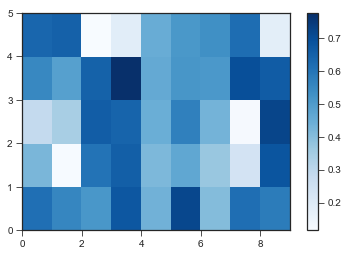

In [447]:
# plt.scatter(distances_6,far_cond_fitness_corr,alpha=0.03,color='gray')
mat = []

for g,gene in enumerate(gene_list):
    mat.append([])
    
    for missense_mutant in this_data[this_data['mutation_type']=='IRA1_missense']['barcode'].values:
        
        
        these_mut = list(minimal_training_bcs) + list(testing_bcs)
        
        if missense_mutant in these_mut:
            
            print(this_data[this_data['barcode']==missense_mutant])
        
            mutant_loc = np.where(these_mut==missense_mutant)[0][0]
#             print(all_muts6[mutant_loc,:])
            
            dist = distance.euclidean(geom_medians6[gene],all_muts6[mutant_loc,:])
            print(gene,missense_mutant,dist)
            
            mat[g].append(dist)
    

plt.pcolormesh(mat,cmap='Blues')
plt.colorbar()

In [448]:
len(these_mut)

302

In [449]:
len(this_data)

302

/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/matplotlib/axes/_axes.py:6448: UserWarning: The 'normed' kwarg is deprecated, and has been replaced by the 'density' kwarg.
  warnings.warn("The 'normed' kwarg is deprecated, and has been "


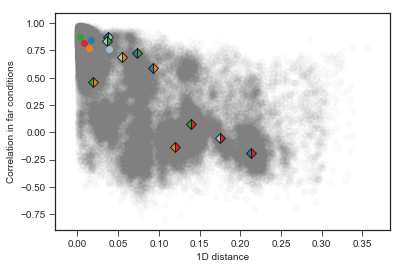

<Figure size 432x288 with 0 Axes>

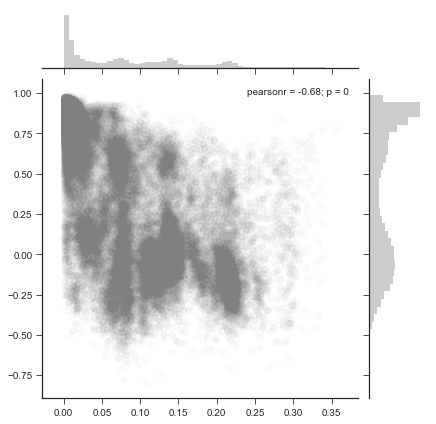

In [450]:
subtle_cond_fitness_corr = distance.squareform(np.corrcoef(this_fitness[:,:len(train_conditions)]),checks=False)



plt.scatter(distances_1,subtle_cond_fitness_corr,alpha=0.03,color='gray')
for gene1, gene2 in combinations(gene_list,2):
    gene1_traj = np.median(this_data[this_data['mutation_type']==gene1][train_conditions].values,axis=0)
    gene2_traj = np.median(this_data[this_data['mutation_type']==gene2][train_conditions].values,axis=0)
        
    plt.plot(
        distance.euclidean(geom_medians1[gene1],geom_medians1[gene2]),
        np.corrcoef(gene1_traj,gene2_traj)[0][1],     
                label=f'{gene1} and {gene2}',color=tools.mutant_colorset[gene1],marker='D',fillstyle = 'left',
            markerfacecoloralt=tools.mutant_colorset[gene2],linestyle='',markersize=7,markeredgecolor='k',alpha=0.9)

    
for gene in gene_list:
    avg_corr = np.mean(distance.squareform(np.corrcoef(this_data[this_data['mutation_type']==gene][train_conditions].values),checks=False))

    plt.plot(avg_pairwise1[gene],avg_corr,marker='o',linestyle='',color=tools.mutant_colorset[gene],alpha=0.8,label=f'Average pairwise for {gene}')

plt.xlabel('1D distance')
plt.ylabel('Correlation in far conditions')

plt.figure()
sns.jointplot(distances_1,subtle_cond_fitness_corr,alpha=0.03,color='gray')

ValueError: x and y must be the same size

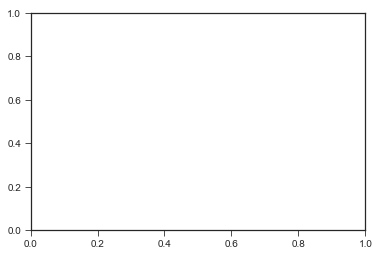

In [451]:
plt.scatter(distances_1,far_cond_fitness_corr,alpha=0.03,color='gray')
for gene1, gene2 in combinations(gene_list,2):
    gene1_traj = np.median(this_data[this_data['mutation_type']==gene1][test_conditions].values,axis=0)
    gene2_traj = np.median(this_data[this_data['mutation_type']==gene2][test_conditions].values,axis=0)
        
    plt.plot(
        distance.euclidean(geom_medians1[gene1],geom_medians1[gene2]),
        np.corrcoef(gene1_traj,gene2_traj)[0][1],     
                label=f'{gene1} and {gene2}',color=tools.mutant_colorset[gene1],marker='D',fillstyle = 'left',
            markerfacecoloralt=tools.mutant_colorset[gene2],linestyle='',markersize=7,markeredgecolor='k',alpha=0.9)

    
for gene in gene_list:
    avg_corr = np.mean(distance.squareform(np.corrcoef(this_data[this_data['mutation_type']==gene][test_conditions].values),checks=False))

    plt.plot(avg_pairwise1[gene],avg_corr,marker='o',linestyle='',color=tools.mutant_colorset[gene],alpha=0.8,label=f'Average pairwise for {gene}')

plt.xlabel('1D distance')
plt.ylabel('Correlation in far conditions')

plt.figure()
sns.jointplot(distances_1,far_cond_fitness_corr,alpha=0.03,color='gray')

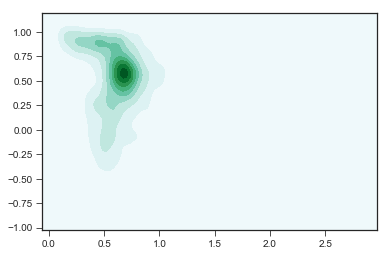

In [376]:
# sns.jointplot(distances_1,far_cond_fitness_corr,alpha=0.03,color='gray')
sns.kdeplot(distances_6,far_cond_fitness_corr,shade=True)

ValueError: operands could not be broadcast together with shapes (45451,) (8001,) 

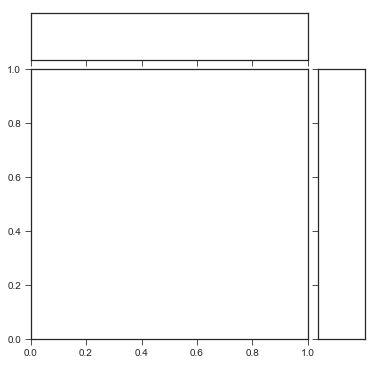

In [452]:
plt.figure
sns.jointplot(distances_6,far_cond_fitness_corr,alpha=0.03)
plt.figure()
plt.scatter(distances_6,far_cond_fitness_corr,alpha=0.03,color='gray')
plt.figure()
perm1 =np.random.permutation(distances_6) 
perm2=np.random.permutation(far_cond_fitness_corr)
plt.scatter(perm1,perm2,alpha=0.03,color='gray')
sns.kdeplot(perm1,perm2,shade=True)

plt.figure()
sns.kdeplot(perm1,perm2,shade=True)
plt.scatter(distances_6,far_cond_fitness_corr,alpha=0.01,color='gray')

In [323]:
len(all_mut_locs)

127

In [347]:
np.corrcoef(new_cond[:,:-2])

array([[ 1.        ,  0.58679406,  0.7209381 , ...,  0.79722905,
         0.15745297,  0.31332587],
       [ 0.58679406,  1.        ,  0.45179337, ...,  0.10231791,
        -0.30389904, -0.04191682],
       [ 0.7209381 ,  0.45179337,  1.        , ...,  0.75951752,
         0.43674029, -0.00410277],
       ...,
       [ 0.79722905,  0.10231791,  0.75951752, ...,  1.        ,
         0.61315152,  0.33030605],
       [ 0.15745297, -0.30389904,  0.43674029, ...,  0.61315152,
         1.        ,  0.3169719 ],
       [ 0.31332587, -0.04191682, -0.00410277, ...,  0.33030605,
         0.3169719 ,  1.        ]])

474


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/matplotlib/pyplot.py:537: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


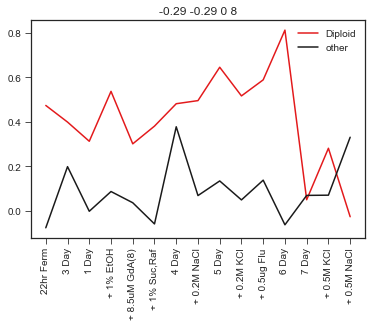

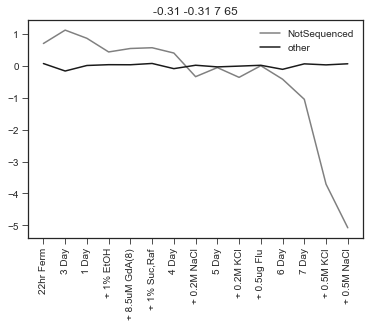

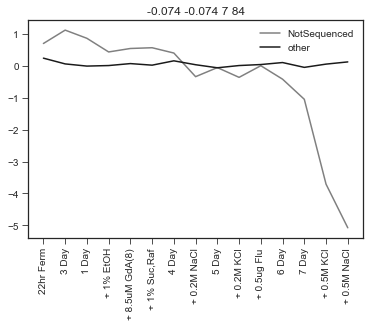

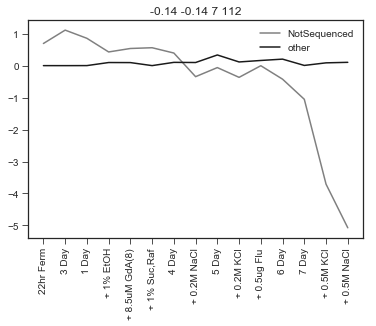

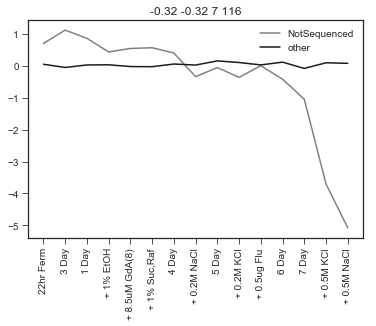

...

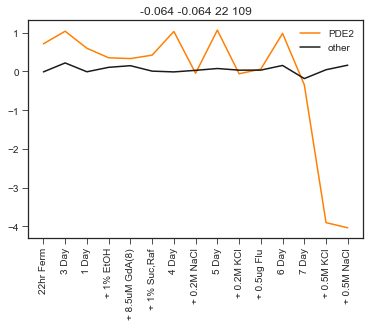

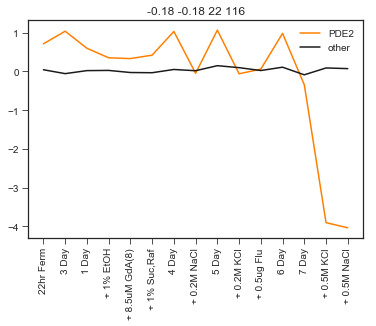

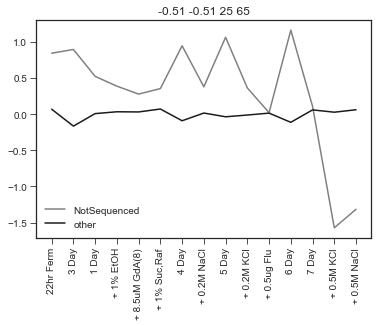

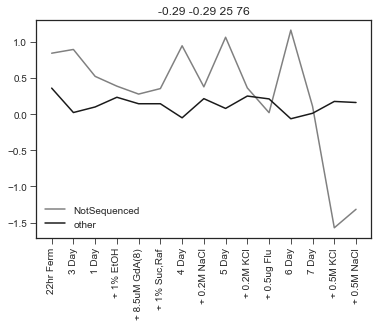

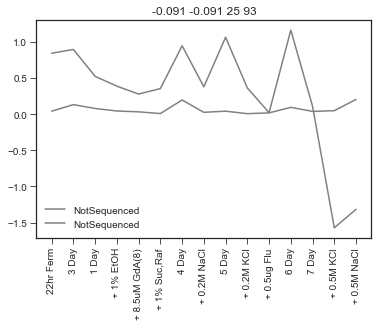

In [389]:
xs,ys = np.where((np.corrcoef(new_cond[:,:])<0) & (distance.squareform(distances_6) < 0.45))
print(len(xs))

counter = 0
for (x,y) in zip(xs,ys):
    if x not in [1,2,3,4,5,6]:
    #     print(x,y)
        bc_x = this_data['barcode'].values[all_mut_locs][x]
        bc_y = this_data['barcode'].values[all_mut_locs][y]
        gene_x = this_data[this_data['barcode'].isin([bc_x])]['mutation_type'].values[0]
        gene_y = this_data[this_data['barcode'].isin([bc_y])]['mutation_type'].values[0]
        data_x = this_data[this_data['barcode'].isin([bc_x])][test_conditions].values[0]
        data_y = this_data[this_data['barcode'].isin([bc_y])][test_conditions].values[0]

        r = np.sum((data_x-np.mean(data_x))*((data_y-np.mean(data_y))))/(np.sqrt(np.sum((data_x-np.mean(data_x))**2))*np.sqrt(np.sum((data_y-np.mean(data_y))**2)))
        their_r = (np.corrcoef(new_cond)[x,y])
#         shorted_theirs = (np.corrcoef(new_cond[:,:-2])[x,y])

        plt.figure()
        plt.title(f'{their_r:.2g} {r:.2g} {x} {y}')
        plt.plot(data_x,
                 label=gene_x,color=mutant_colorset[gene_x])
        plt.plot(data_y,
                label=gene_y,color=mutant_colorset[gene_y])
        plt.legend()
        plt.xticks(range(len(test_conditions)),[renamed_conditions[col.replace('_fitness','')] for col in test_conditions],rotation=90)
    #     print([['barcode','gene','type']])
    #     print(nothing)
        if counter == 50:
            break
        counter +=1 


In [285]:
this_data[this_data['barcode'].isin([bc_x])][test_conditions].values

array([[ 0.47428997,  0.39946836,  0.31318428,  0.53763039,  0.30160908,
         0.3813191 ,  0.48204663,  0.4959972 ,  0.64607548,  0.51713272,
         0.58937866,  0.81303997,  0.05021105,  0.28177431, -0.02622815]])

In [348]:
this_data

,barcode,gene,type,ploidy,class,additional_muts,13.1_error,13.1_fitness,13.2_error,13.2_fitness,...,1BB_0.5%Raf_fitness,1BB_0.5%Raf_error,1BB_1%Gly_fitness,1BB_1%Gly_error,1BB_1%EtOH_fitness,1BB_1%EtOH_error,1BB_SucRaf_fitness,1BB_SucRaf_error,mutation_type,batch_mean
0,53,Diploid,Diploid,Diploid,Diploid,TIP1-upstream_point_variant; YKR012C-upstream_...,0.086877,0.366047,0.083404,0.315150,...,0.267181,0.024068,0.347187,0.030065,0.537630,0.021632,0.381319,0.065192,Diploid,0.374319
1,151,IRA1,stop_gained,Haploid,PKA,SEH1-missense_variant; ZIP1-missense_variant; ...,0.059241,1.628226,0.059251,1.570717,...,0.994910,0.016550,1.038026,0.023238,0.715633,0.016767,0.595644,0.050561,IRA1_nonsense,1.217743
2,262,NotSequenced,NotSequenced,NotSequenced,NotSequenced,NotSequenced,0.069475,0.196277,0.068634,0.105044,...,0.286933,0.025276,0.345255,0.031072,0.493757,0.023397,0.350548,0.067009,NotSequenced,0.271445
3,273,IRA1,frameshift_variant,Haploid,PKA,None,0.059303,1.133521,0.059304,1.206520,...,0.775972,0.016898,0.812373,0.023670,0.494898,0.018183,0.452001,0.051965,IRA1_nonsense,0.921415
4,323,NotSequenced,NotSequenced,NotSequenced,NotSequenced,NotSequenced,0.059382,1.113742,0.059383,1.101149,...,0.628388,0.017825,0.663332,0.024495,0.433916,0.019959,0.291819,0.055298,NotSequenced,0.875994
8,689,IRA1,frameshift_variant,Haploid,PKA,RPL19A-upstream_point_variant,0.059639,1.351715,0.059628,1.287908,...,0.986495,0.017254,1.089611,0.024627,0.688321,0.022166,0.504585,0.054950,IRA1_nonsense,1.098547
9,697,NotSequenced,NotSequenced,NotSequenced,NotSequenced,NotSequenced,0.079211,0.292709,0.078981,0.195564,...,0.215339,0.025871,0.299675,0.032186,0.490181,0.023398,0.369475,0.069865,NotSequenced,0.327402
12,1379,NotSequenced,NotSequenced,NotSequenced,NotSequenced,NotSequenced,0.059238,1.474213,0.059241,1.421350,...,0.864478,0.016595,0.983229,0.023286,0.446068,0.017521,0.416034,0.050919,NotSequenced,1.162328
13,1488,NotSequenced,NotSequenced,NotSequenced,NotSequenced,NotSequenced,0.059386,1.346518,0.059399,1.306377,...,0.944628,0.016728,1.035003,0.023628,0.429861,0.019687,0.561952,0.051527,NotSequenced,1.106314
14,1564,Diploid,Diploid,Diploid,Diploid,None,0.083986,0.379311,0.087251,0.141528,...,0.178112,0.026440,0.315670,0.033512,0.506919,0.024411,0.346503,0.072595,Diploid,0.310565


In [326]:
np.sqrt(np.sum(np.square(data_x-np.mean(data_x))))

5.198316799237155

In [307]:
sum((data_x-np.mean(data_x))*(data_y-np.mean(data_y)))

0.49555870876903113

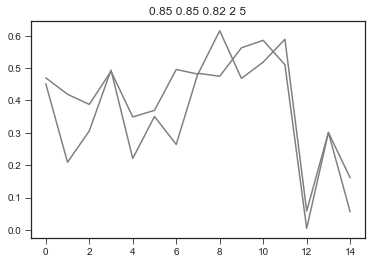

In [387]:
x =2
y=5
bc_x = this_data['barcode'].values[all_mut_locs][x]
bc_y = this_data['barcode'].values[all_mut_locs][y]
gene_x = this_data[this_data['barcode'].isin([bc_x])]['mutation_type'].values[0]
gene_y = this_data[this_data['barcode'].isin([bc_y])]['mutation_type'].values[0]
data_x = this_data[this_data['barcode'].isin([bc_x])][test_conditions].values[0]
data_y = this_data[this_data['barcode'].isin([bc_y])][test_conditions].values[0]

r = np.sum((data_x-np.mean(data_x))*((data_y-np.mean(data_y))))/(np.sqrt(np.sum((data_x-np.mean(data_x))**2))*np.sqrt(np.sum((data_y-np.mean(data_y))**2)))
#     r = 
#     print(r)
their_r = (np.corrcoef(new_cond)[x,y])
#     print(their_r)
plt.figure()
plt.title(f'{their_r:.2g} {r:.2g} {x} {y}')
plt.plot(data_x,
         label=gene_x,color=mutant_colorset[gene_x])
plt.plot(data_y,
        label=gene_y,color=mutant_colorset[gene_y])

In [361]:
print(all_m[1],all_m[27])
this_data['barcode'].values[all_m[1]]

4 10


323

In [362]:
this_data[this_data['barcode']==323]

,barcode,gene,type,ploidy,class,additional_muts,13.1_error,13.1_fitness,13.2_error,13.2_fitness,...,1BB_0.5%Raf_fitness,1BB_0.5%Raf_error,1BB_1%Gly_fitness,1BB_1%Gly_error,1BB_1%EtOH_fitness,1BB_1%EtOH_error,1BB_SucRaf_fitness,1BB_SucRaf_error,mutation_type,batch_mean
4,323,NotSequenced,NotSequenced,NotSequenced,NotSequenced,NotSequenced,0.059382,1.113742,0.059383,1.101149,...,0.628388,0.017825,0.663332,0.024495,0.433916,0.019959,0.291819,0.055298,NotSequenced,0.875994


In [363]:
all_m

[1,
 4,
 12,
 22,
 23,
 24,
 31,
 34,
 44,
 45,
 48,
 53,
 54,
 60,
 70,
 73,
 74,
 90,
 101,
 0,
 2,
 3,
 5,
 6,
 7,
 8,
 9,
 10,
 11,
 13,
 14,
 15,
 16,
 17,
 18,
 19,
 20,
 21,
 25,
 26,
 27,
 28,
 29,
 30,
 32,
 33,
 35,
 36,
 37,
 38,
 39,
 40,
 41,
 42,
 43,
 46,
 47,
 49,
 50,
 51,
 52,
 55,
 56,
 57,
 58,
 59,
 61,
 62,
 63,
 64,
 65,
 66,
 67,
 68,
 69,
 71,
 72,
 75,
 76,
 77,
 78,
 79,
 80,
 81,
 82,
 83,
 84,
 85,
 86,
 87,
 88,
 89,
 91,
 92,
 93,
 94,
 95,
 96,
 97,
 98,
 99,
 100,
 102,
 103,
 104,
 105,
 106,
 107,
 108,
 109,
 110,
 111,
 112,
 113,
 114,
 115,
 116,
 117,
 118,
 119,
 120,
 121,
 122,
 123,
 124,
 125,
 126]

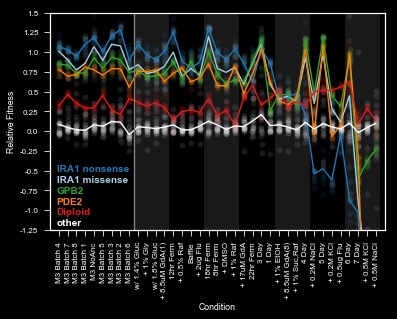

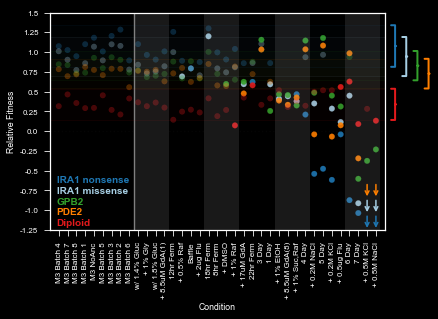

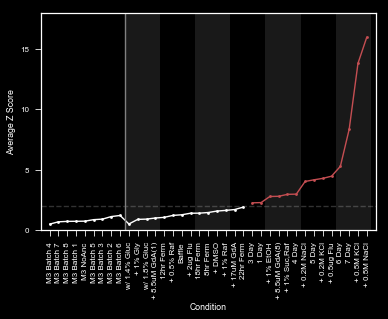

In [499]:




sns.set_style('ticks')
# sns.set_style('dark')
sns.set_context("paper")
plt.style.use('dark_background')
gene_list = ['IRA1_nonsense','IRA1_missense','GPB2','PDE2','Diploid','other']
    # fig = plt.figure(figsize=(2*8,2*6+1))
    # gs = GridSpec(3, 2, width_ratios=[1, 1], height_ratios=[6, 1, 6],hspace=0.05)
plt.figure()
ax1= plt.subplot()



# this_gene = ['IRA1_nonsense','IRA1_missense','GPB2','PDE2','Diploid','other']
graphs.fitness_featured_genes_figure(ax1,this_data,minimal_training_bcs,minimal_testing_bcs,m3_conditions,nonm3_conditions,gene_list,fontsize=10,yticknum=12,style='dark')
# plt.text(s='A',x=-0.1,y=1.05,fontsize=15,fontweight='semibold',transform=ax1.transAxes)

plt.savefig('talk_figures/Figure3a_dark.pdf',bbox_inches='tight')

gene_list = ['IRA1_nonsense','IRA1_missense','GPB2','PDE2','Diploid']
# plt.xlabel('')
plt.figure()
ax2 = plt.subplot()

gene_list = ['IRA1_nonsense','IRA1_missense','GPB2','PDE2','Diploid']
graphs.fitness_tubes_graph(ax2,this_data,mean_std_bygene,minimal_training_bcs,minimal_testing_bcs,m3_conditions,nonm3_conditions,gene_list,fontsize=10,style='dark')

plt.savefig('talk_figures/Figure3b_dark.pdf',bbox_inches='tight')

# plt.text(s='B',x=-0.1,y=1.05,fontsize=15,fontweight='semibold',transform=ax2.transAxes)
plt.figure()
ax3 = plt.subplot()

graphs.zscore_graph(ax3,m3_z_scores,nonm3_z_scores,sorted_m3_cols,sorted_nonm3_cols,style='dark')

plt.savefig('talk_figures/Figure3c_dark.pdf',bbox_inches='tight')

# plt.tight_layout() # only off when tight layout is used - might need to annotate afterwards



In [506]:
# %%notify

this_data = merged_fitness_data
this_data = this_data.replace([np.inf, -np.inf], np.nan)
this_data = this_data.dropna('columns',how='all')
this_data = this_data.dropna()
this_data = this_data.sort_values('barcode')

this_data['batch_mean'] = np.mean(this_data[[col for col in sorted_m3_cols]].values,axis=1)

# last_subtle = 1

train_cols = list(sorted_m3_cols) + list(sorted_nonm3_cols[:last_subtle])
# test_cols = list(nonm3_cols[last_subtle:])+['batch_mean']

test_cols = list(sorted_nonm3_cols[last_subtle:])
# test_cols = ['batch_mean']

fitness_cols = train_cols + test_cols

fitness = this_data[fitness_cols].values

n_mutants = fitness.shape[0]
n_conditions = fitness.shape[1]

train_conditions = train_cols
train_locs = np.where(np.isin(fitness_cols,train_conditions))[0]

test_conditions = test_cols
test_locs = np.where(np.isin(fitness_cols,test_conditions))[0]

testing_bcs = minimal_testing_bcs
# testing_bcs = [bc for bc in this_data['barcode'].values if bc not in (list(minimal_training_bcs))]

all_locs = sorted(list(train_locs)+list(test_locs))

used_mutants = [bc for bc in this_data['barcode'].values if bc in (list(minimal_training_bcs) + list(testing_bcs))]

all_mut_locs =sorted(list(np.where(np.isin(this_data['barcode'].values,used_mutants))[0]))

this_fitness = fitness[all_mut_locs,:][:,all_locs]
new_train_locs = np.where(np.isin(all_locs,train_locs))[0]
new_test_locs = np.where(np.isin(all_locs,test_locs))[0]  

train = [new_train_locs,np.where(np.isin(used_mutants,minimal_training_bcs))[0]]
test = [new_test_locs,np.where(np.isin(used_mutants,testing_bcs))[0]]

train_c = train[0]
train_m = train[1]

test_c = test[0]
test_m = test[1]

both_new = this_fitness[np.repeat(test_m,len(test_c)),np.tile(test_c,len(test_m))].reshape(len(test_m),len(test_c))

all_m = sorted(list(train_m) + list(test_m))
new_cond = this_fitness[np.repeat(all_m,len(test_c)),np.tile(test_c,len(all_m))].reshape(len(all_m),len(test_c))





/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/matplotlib/pyplot.py:537: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


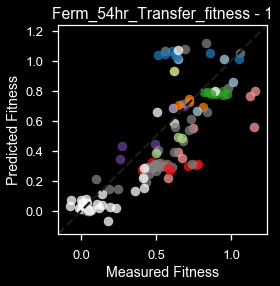

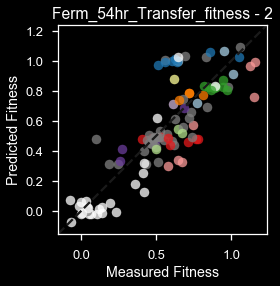

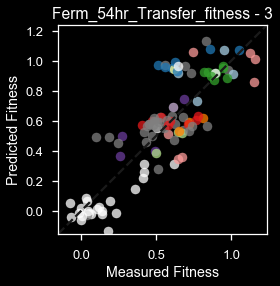

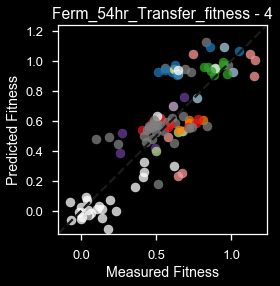

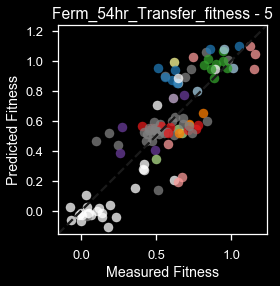

...

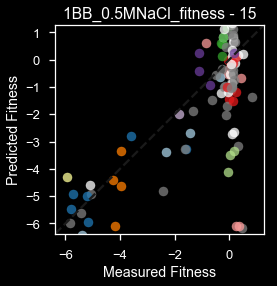

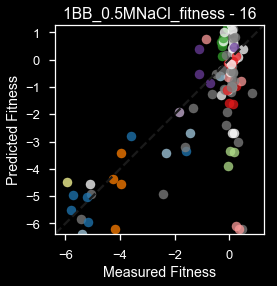

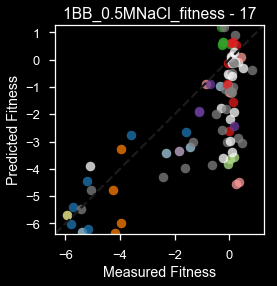

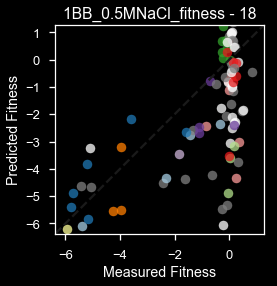

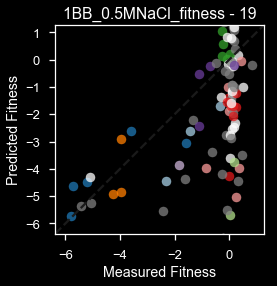

In [508]:
fit_by_rank, fits_by_condition, fits_by_mutant, mean_fits,mean_fits_by_condition, guesses = tools.SVD_predictions_train_test(this_fitness,train,test,by_condition=True,by_mutant=True)

# test_mutant_data = this_data[~this_data['barcode'].isin(minimal_training_bcs)]
# test_mutant_data = this_data[this_data['barcode'].isin(minimal_testing_bcs)]

test_mutant_data = testing_bcs

plt.style.use('dark_background')
sns.set_context('talk')
# this_gene = ['GPB2','PDE2','IRA1','Diploid']
# this
# this_gene_data = test_mutant_data[test_mutant_data['gene'].isin(this_gene)]

this_gene_data = test_mutant_data
this_gene_data = this_data[this_data['barcode'].isin(test_mutant_data)]

# type_list = ['nonsense_variant','frameshift_variant']
# type_list = ['missense_variant']
# this_gene_data = this_gene_data[this_gene_data['type'].isin(type_list)]
this_gene_locs = range(len(this_gene_data))

# this_gene_locs = np.where(np.isin(test_mutant_data['barcode'].values,this_gene_data['barcode'].values))[0]
jitters = [tools.jitter_point(0,0.01) for bc in range(len(this_gene_data[train_conditions[0]].values)) ]

for i,col in enumerate(test_conditions):
    for rank in range(len(guesses)):
        plt.figure()
        plt.title(f'{col} - {rank+1}')
        for bc in range(len(this_gene_data[col].values)):
#             plt.scatter(this_gene_data[col].values[bc],guesses[rank][this_gene_locs[bc],i],color=mutant_colorset[this_gene_data['gene'].values[bc]],alpha=0.6)
            plt.scatter(this_gene_data[col].values[bc],guesses[rank][this_gene_locs[bc],i],color=mutant_colorset[this_gene_data['mutation_type'].values[bc]],alpha=0.75)


        if rank == 0:
            xmin,xmax = plt.xlim()
            ymin,ymax = plt.ylim()
        plt.xlim(min(xmin,ymin),max(xmax,ymax))
        plt.ylim(min(xmin,ymin),max(xmax,ymax))
        plt.tight_layout()
        plt.plot([min(xmin,ymin),max(xmax,ymax)],[min(xmin,ymin),max(xmax,ymax)],'k--')
        plt.gca().set_aspect('equal')
        plt.xlabel('Measured Fitness')
        plt.ylabel('Predicted Fitness')
        plt.savefig(f'talk_figures/predictions/predictions_by_gene_sidebyside_minimaltraining_{col.replace("/","")}_{rank+1}components_lims.pdf',bbox_inches='tight')

0.0007596816609135001 0.0004022198697438313 0.5294584435014147


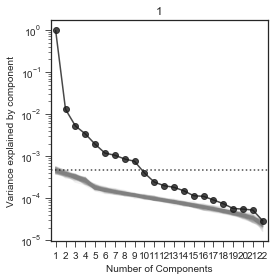

In [128]:
this_err = this_data[this_data['barcode'].isin(used_mutants)][[train_conditions[entry].replace('_fitness','_error') for entry in train[0]]].values
reduce = [1]
plt.figure(figsize=(4*len(reduce),4*1))
for r,err_reduction in enumerate(reduce):
    ax = plt.subplot(1,len(reduce),r+1)
    plt.title(err_reduction)
    tools.svd_noise_comparison_figure(ax,this_fitness[all_m,:][:,train[0]],this_err*err_reduction,100)
    plt.yscale('log')
plt.tight_layout()
# plt.savefig('SVD_noise_model_subtle+training_bcs.pdf',bbox_inches='tight')

In [504]:
tools.SVD_predictions_train_test(this_fitness,train,test,by_condition=True,by_mutant=True)

[53,
 262,
 273,
 323,
 697,
 1379,
 1488,
 1564,
 1617,
 1641,
 1866,
 2037,
 2039,
 2288,
 2608,
 2768,
 2808,
 3250,
 3379,
 3577,
 3585,
 3675,
 3730,
 3920,
 4418,
 4691,
 4791,
 4949,
 5564,
 5804,
 7269,
 7375,
 7423,
 7539,
 7774,
 7799,
 7836,
 7953,
 7961,
 8297,
 8459,
 8825,
 9293,
 9589,
 9864,
 9888,
 10050,
 10103,
 10307,
 10316,
 10851,
 11430,
 11667,
 11752,
 11933,
 12090,
 13029,
 13132,
 13183,
 13852,
 13872,
 14485,
 14849,
 15221,
 15337,
 15787,
 16720,
 18152,
 18200,
 18352,
 18420,
 18501,
 18860,
 18950,
 19184,
 19297,
 19697,
 19795,
 19894,
 20083,
 20464,
 20873,
 20967,
 21543,
 21625,
 21956,
 21967,
 22011,
 22162,
 22360,
 22469,
 23688,
 24737,
 24858,
 25531,
 25747,
 25780,
 26106,
 27346,
 28533,
 28740,
 29375,
 29473,
 29840,
 30578,
 30769,
 30795,
 31360,
 31607,
 32075,
 32262,
 32685,
 33617,
 33976,
 34808,
 37238,
 37241,
 38775,
 39674,
 40779,
 40865,
 41484,
 42575,
 43155,
 44971,
 45031,
 46313,
 46938,
 48822,
 48904,
 49174,
 502

In [149]:
help(sns.distplot)

Help on function distplot in module seaborn.distributions:

distplot(a, bins=None, hist=True, kde=True, rug=False, fit=None, hist_kws=None, kde_kws=None, rug_kws=None, fit_kws=None, color=None, vertical=False, norm_hist=False, axlabel=None, label=None, ax=None)
    Flexibly plot a univariate distribution of observations.
    
    This function combines the matplotlib ``hist`` function (with automatic
    calculation of a good default bin size) with the seaborn :func:`kdeplot`
    and :func:`rugplot` functions. It can also fit ``scipy.stats``
    distributions and plot the estimated PDF over the data.
    
    Parameters
    ----------
    
    a : Series, 1d-array, or list.
        Observed data. If this is a Series object with a ``name`` attribute,
        the name will be used to label the data axis.
    bins : argument for matplotlib hist(), or None, optional
        Specification of hist bins, or None to use Freedman-Diaconis rule.
    hist : bool, optional
        Whether to plot 

{'0': (131.2628027785883, 4), '1': (40.11919219715364, 5), '2': (45.14368715195474, 5), '3': (49.21193078150206, 4), '4': (29.948085119561256, 4), '5': (32.36759927429625, 4), '6': (18.602799027842035, 5), '7': (67.75947951748785, 3), '8': (35.783033439625854, 6), '9': (27.08666023437978, 6), '10': (70.36950193369691, 5), '11': (107.46675172897896, 4), '12': (54.409138353198514, 3), '13': (48.09258471877362, 7), '14': (34.60938393661275, 6), '15': (43.01701687472017, 5), '16': (40.89030296695203, 4), '17': (175.17038967277148, 3), '18': (30.439037508335577, 4), '19': (68.55614474071552, 4), '20': (59.39214040763578, 3), '21': (47.227951287612115, 4), '22': (69.23985519314165, 4), '23': (45.242932721764134, 5), '24': (31.745698854319887, 4), '25': (22.385775167066036, 5), '26': (24.254549552656577, 4), '27': (65.90301312928078, 5), '28': (36.98992030255764, 6), '29': (28.008722943391177, 4), '30': (64.080680878311, 5), '31': (46.096103656040384, 3), '32': (42.058206924929394, 4), '33': 

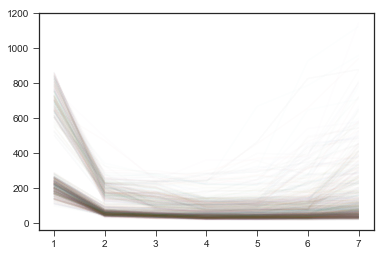

In [158]:
# %%notify

last_subtle = 13
# last_subtle = nonm3_subtle_locs[-1]+1

this_data = merged_fitness_data
this_data = this_data.replace([np.inf, -np.inf], np.nan)
this_data = this_data.dropna('columns',how='all')
this_data = this_data.dropna()
this_data = this_data.sort_values('barcode')

# this_data['batch_mean'] = np.mean(this_data[[col for col in sorted_m3_cols]].values,axis=1)

best_guesses = {}

# total = np.zeros()

cols_avail = list(sorted_m3_cols) + list(sorted_nonm3_cols[:last_subtle])
cols_avail = list(sorted_nonm3_cols[last_subtle:])

n_iterations = 1000

for iteration,this_set in enumerate(range(n_iterations)):
    first_set =  sorted(np.random.choice(range(len(cols_avail)),int(len(cols_avail)/2),replace=False))
    second_set = [i for i in range(len(cols_avail)) if i not in first_set]
#     first_set = [i+this_set[count] for count,i in enumerate(range(0,len(cols_avail),2))]
#     second_set = [i for i in range(len(cols_avail)) if i not in first_set]
    
    cols_avail = np.asarray(cols_avail)
    
    train_cols = list(cols_avail[first_set])
    test_cols = list(cols_avail[second_set])

    fitness_cols = train_cols + test_cols

    fitness = this_data[fitness_cols].values

    n_mutants = fitness.shape[0]
    n_conditions = fitness.shape[1]

    train_conditions = train_cols
    train_locs = np.where(np.isin(fitness_cols,train_conditions))[0]

    test_conditions = test_cols
    test_locs = np.where(np.isin(fitness_cols,test_conditions))[0]

    all_locs = sorted(list(train_locs)+list(test_locs))

    used_mutants = [bc for bc in this_data['barcode'].values if bc in (list(minimal_training_bcs) + list(minimal_testing_bcs))]

    all_mut_locs =sorted(list(np.where(np.isin(this_data['barcode'].values,used_mutants))[0]))

    this_fitness = fitness[all_mut_locs,:][:,all_locs]
    new_train_locs = np.where(np.isin(all_locs,train_locs))[0]
    new_test_locs = np.where(np.isin(all_locs,test_locs))[0]  

    train = [new_train_locs,np.where(np.isin(used_mutants,minimal_training_bcs))[0]]
    test = [new_test_locs,np.where(np.isin(used_mutants,minimal_testing_bcs))[0]]

    max_rank = min([len(train[0]),len(train[1])])

    # SVD predictions with all combinations of components, in parallel
    
    output = tools.SVD_predictions_train_test(this_fitness,train,test,by_condition=True,mse=True)
#     print(output)
#     with Pool(len(train_cols)+1) as pool:
#         entries = [[this_fitness,train,test,n_components,True,False,False] for n_components in range(1,max_rank+1)]
#         output = pool.starmap(tools.SVD_predictions_train_test_mixnmatch,entries)

    sort_list = []
    guess_list = []
#     print(output[0])
    sort_list = output[0]
    
#     for o in output:
#         sort_list.append(sorted([(o1,o2,o3) for o1,o2,o3 in zip(o[0],o[3],o[1])],reverse=True))
#         guess_list.append(sorted([(o1,o2) for o1,o2 in zip(o[0],o[-1])],reverse=True))
#     for o in output:
#         sort_list.append(sorted([(o1,o2,o3) for o1,o2,o3 in zip(o[0],o[4],o[1])],reverse=True))
#         guess_list.append(sorted([(o1,o2) for o1,o2 in zip(o[0],o[-1])],reverse=True))

#     best_by_rank = [sort_list[rank][0][0] for rank in range(len(sort_list))]
    best_by_rank = output[0]
    if iteration == 0:
        total = np.asarray(best_by_rank)
    else:
        total = total + np.asarray(best_by_rank)

    plt.plot(range(1,len(best_by_rank)+1),best_by_rank,alpha=0.01)

#     best_guesses[f'{iteration}'] = (max(best_by_rank),np.where(best_by_rank==max(best_by_rank))[0][0] +1)
    best_guesses[f'{iteration}'] = (min(best_by_rank),np.where(best_by_rank==min(best_by_rank))[0][0] +1)
# plt.legend()
# plt.ylim(0,1)
# plt.plot(range(1,len(total)+1),total,color='k',alpha=0.5)
# plt.savefig('close_conditions_odd_even_ALL_CV_nomixnmatch_mse.pdf',bbox_inches='tight')

print(best_guesses)

/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/matplotlib/axes/_axes.py:6448: UserWarning: The 'normed' kwarg is deprecated, and has been replaced by the 'density' kwarg.
  warnings.warn("The 'normed' kwarg is deprecated, and has been "


([<matplotlib.axis.XTick at 0x116844518>,
 <a list of 7 Text xticklabel objects>)

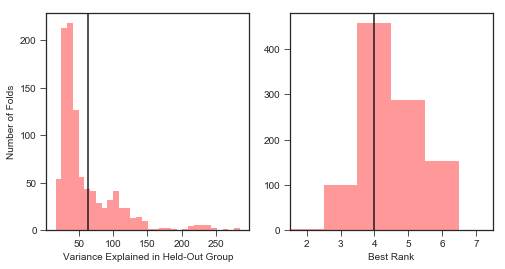

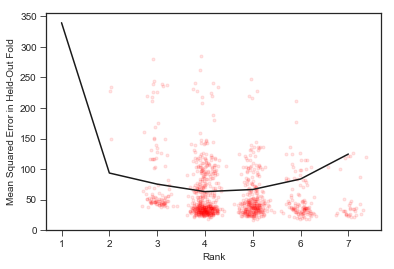

In [159]:
plt.figure(figsize=(8,4))
plt.subplot(121)
these_guesses = [item[0] for item in best_guesses.values()]
plt.axvline(min(total/len(best_guesses)),color='k')
sns.distplot(these_guesses,kde=False,color='red')
plt.xlabel('Variance Explained in Held-Out Group')
plt.ylabel('Number of Folds')
plt.subplot(122)
ranks = [item[1] for item in best_guesses.values()]
sns.distplot(ranks,kde=False,bins=np.arange(min(ranks), max(ranks) + 1),color='red')
plt.axvline(np.where(total==min(total))[0]+1.5,color='k')
plt.xlabel('Best Rank')
# plt.ylabel('Count (of 100)')

plt.xticks(np.arange(min(ranks)+0.5, max(ranks) + 1.5),np.arange(min(ranks), max(ranks)+1 ))
plt.xlim(min(ranks),max(ranks)+1)
# plt.savefig('best_rank_found_ALL_randomchoices_mse.pdf',bbox_inches='tight')

plt.figure()

plt.scatter(tools.jitter_point(ranks),these_guesses,alpha=0.1,marker='.',color='red')
plt.plot(range(1,len(total)+1),total/len(best_guesses),'k',label='Average')
plt.ylabel('Mean Squared Error in Held-Out Fold')
plt.xlabel('Rank')
plt.xticks(range(1,len(total)+1),range(1,len(total)+1))

# plt.savefig('bestfit_by_rank_found_ALL_randomchoices_mse.pdf',bbox_inches='tight')

In [169]:
# %%notify

this_data = merged_fitness_data
this_data = this_data.replace([np.inf, -np.inf], np.nan)
this_data = this_data.dropna('columns',how='all')
this_data = this_data.dropna()
this_data = this_data.sort_values('barcode')

this_data['batch_mean'] = np.mean(this_data[[col for col in sorted_m3_cols]].values,axis=1)

# last_subtle = 1

train_cols = list(sorted_m3_cols) + list(sorted_nonm3_cols[:last_subtle])
train_cols = list(sorted_nonm3_cols[last_subtle:])
# test_cols = list(nonm3_cols[last_subtle:])+['batch_mean']

test_cols = list(sorted_nonm3_cols[last_subtle:])
test_cols = list(sorted_m3_cols) + list(sorted_nonm3_cols[:last_subtle])

# test_cols = ['batch_mean']

fitness_cols = train_cols + test_cols

fitness = this_data[fitness_cols].values

n_mutants = fitness.shape[0]
n_conditions = fitness.shape[1]

train_conditions = train_cols
train_locs = np.where(np.isin(fitness_cols,train_conditions))[0]

test_conditions = test_cols
test_locs = np.where(np.isin(fitness_cols,test_conditions))[0]

testing_bcs = minimal_testing_bcs
# testing_bcs = [bc for bc in this_data['barcode'].values if bc not in (list(minimal_training_bcs))]

all_locs = sorted(list(train_locs)+list(test_locs))

used_mutants = [bc for bc in this_data['barcode'].values if bc in (list(minimal_training_bcs) + list(testing_bcs))]

all_mut_locs =sorted(list(np.where(np.isin(this_data['barcode'].values,used_mutants))[0]))

this_fitness = fitness[all_mut_locs,:][:,all_locs]
new_train_locs = np.where(np.isin(all_locs,train_locs))[0]
new_test_locs = np.where(np.isin(all_locs,test_locs))[0]  

train = [new_train_locs,np.where(np.isin(used_mutants,minimal_training_bcs))[0]]
test = [new_test_locs,np.where(np.isin(used_mutants,testing_bcs))[0]]

train_c = train[0]
train_m = train[1]

test_c = test[0]
test_m = test[1]

both_new = this_fitness[np.repeat(test_m,len(test_c)),np.tile(test_c,len(test_m))].reshape(len(test_m),len(test_c))

all_m = sorted(list(train_m) + list(test_m))
new_cond = this_fitness[np.repeat(all_m,len(test_c)),np.tile(test_c,len(all_m))].reshape(len(all_m),len(test_c))






In [170]:
fit_by_rank, fits_by_condition, fits_by_mutant, mean_fits,mean_fits_by_condition, guesses, dhats, both_old = tools.SVD_predictions_train_test(this_fitness,train,test,by_condition=True,by_mutant=True)

Text(0.531792,-5,'4 component model, $R^2$ = 0.991')

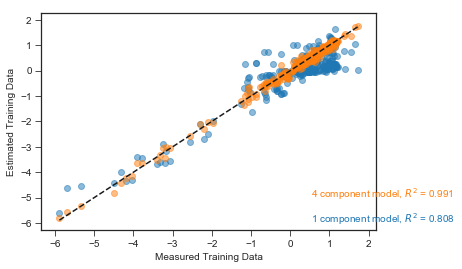

In [171]:
model = 3

plt.scatter(both_old,dhats[0],alpha=0.5,label='1 component model')
plt.scatter(both_old,dhats[model],alpha=0.5,label=f'{model + 1} component model')
plt.xlabel('Measured Training Data')
plt.ylabel('Estimated Training Data')
this_min = min([np.min(both_old),np.min(dhats[model])])
this_max = max([np.max(both_old),np.max(dhats[model])])
plt.plot([this_min,this_max],[this_min,this_max],'k--')
plt.annotate(fr'1 component model, $R^2$ = {tools.var_explained(both_old,dhats[0])[0]:.3g}',xy=(0.3*this_max,-6),
             color=sns.color_palette()[0],transform=ax3.transAxes)
plt.annotate(fr'{model+1} component model, $R^2$ = {tools.var_explained(both_old,dhats[model])[0]:.3g}',xy=(0.3*this_max,-5),
             color=sns.color_palette()[1],transform=ax3.transAxes)

(-1.0, 1.0)

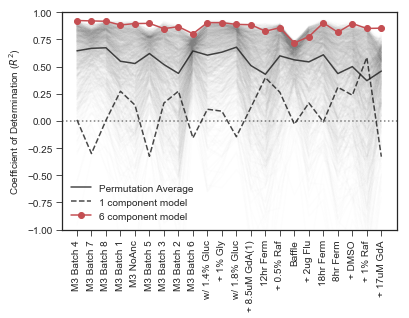

In [172]:
plt.figure()

plt.axhline(0,color='gray',linestyle=':')

perms = np.zeros(both_new.shape[1])

n_perms = 1000
for i in range(n_perms):
    perm_out = tools.SVD_predictions_train_test(this_fitness,train,test,by_condition=True,permuted_conditions=True)
    perm = np.asarray([tools.var_explained(both_new[:,i],perm_out[5][5][:,i])[0] for i in range(both_new.shape[1])])
    perms = perms + perm
    plt.plot(perm,color='gray',alpha=0.01)
plt.plot((perms/n_perms),color='k',alpha=0.8,label='Permutation Average')

dumb = np.asarray([tools.var_explained(both_new[:,i],guesses[0][:,i])[0] for i in range(both_new.shape[1])])
plt.plot(dumb,color='k',linestyle='--',alpha=0.8,label='1 component model')


colors=['r','b','g','m','orange']
for m,model in enumerate(range(5,6)):
    this_sse = np.asarray([tools.var_explained(both_new[:,i],guesses[model][:,i])[0] for i in range(both_new.shape[1])])
    
    plt.plot(this_sse,'o-',label=f'{model+1} component model',color='r',alpha=1.0)
    
# for i in range(100):
#     perm_out = tools.SVD_predictions_train_test(this_fitness,train,test,by_condition=True,permuted_mutants=True)
#     perm = np.asarray([tools.sum_squared_error(perm_out[5][5][:,i],both_new[:,i]) for i in range(both_new.shape[1])])
#     plt.plot((dumb - perm)/(dumb - min_sse),color='orange',linestyle='--')

plt.ylabel(r'Coefficient of Determination ($R^2$)')

plt.xticks(range(len(test_conditions)),[renamed_conditions[col.replace('_fitness','')] for col in test_conditions],rotation=90)
plt.legend()

plt.ylim(-1.0,1.0)

# plt.savefig('far_predictions_VE_alltestBC.pdf',bbox_inches='tight')

In [173]:
model = 1

fit, train_muts, test_muts, train_cond, test_cond = tools.SVD_mixnmatch_locations(this_fitness,train,test,range(model))
all_muts1 = np.concatenate((train_muts,test_muts))
all_muts1 = all_muts1[np.argsort(np.concatenate((train[1],test[1])))]

distances_1 = distance.pdist(all_muts1)
distances_1cb = distance.pdist(all_muts1,'cityblock')

mean_batch_fitness = this_data['batch_mean'].values[all_mut_locs].reshape((len(all_mut_locs),1))
distances_fitness = distance.pdist(mean_batch_fitness,'minkowski',p=1)

model = 2

fit, train_muts, test_muts, train_cond, test_cond = tools.SVD_mixnmatch_locations(this_fitness,train,test,range(model))
all_muts2 = np.concatenate((train_muts,test_muts))
all_muts2 = all_muts2[np.argsort(np.concatenate((train[1],test[1])))]

distances_2 = distance.pdist(all_muts2)
distances_2cb = distance.pdist(all_muts2,'cityblock')

mean_batch_fitness = this_data['batch_mean'].values[all_mut_locs].reshape((len(all_mut_locs),1))
distances_fitness = distance.pdist(mean_batch_fitness,'minkowski',p=1)


model = 4

fit, train_muts, test_muts, train_cond, test_cond = tools.SVD_mixnmatch_locations(this_fitness,train,test,range(6))
all_muts6 = np.concatenate((train_muts,test_muts))
all_muts6 = all_muts6[np.argsort(np.concatenate((train[1],test[1])))]

distances_6 = distance.pdist(all_muts6)
distances_6cb = distance.pdist(all_muts6,'cityblock')



0.13603219424442758
0.7033469550702816
0.8693180073943079


In [175]:
geom_medians6= {}
geom_medians1= {}
fitness_median = {}

avg_pairwise6= {}
avg_pairwise6cb= {}
avg_pairwise1= {}
avg_pairwise_fitness = {}

distance_from_median_stats = {}
distances_from_median = {}
distances_from_mediancb = {}


gene_list = ['GPB2','PDE2','IRA1','Diploid']
gene_list = ['IRA1_nonsense','IRA1_missense','GPB2','PDE2','Diploid']

for gene in gene_list:
    these_locs = np.where(np.isin(used_mutants,this_data[this_data['mutation_type']==gene]['barcode'].values))
    print(gene,len(these_locs[0]))
    geom_medians6[gene] = tools.geometric_median(all_muts6[these_locs,:][0])
    geom_medians1[gene] = tools.geometric_median(all_muts1[these_locs,:][0])
    f_data = this_data[this_data['mutation_type']==gene]['batch_mean'].values
    fitness_median[gene] = np.median(f_data)
    
    avg_pairwise6[gene] = np.mean(distance.pdist(all_muts6[these_locs,:][0]))
    avg_pairwise6cb[gene] = np.mean(distance.pdist(all_muts6[these_locs,:][0],'cityblock'))
    avg_pairwise1[gene] = np.mean(distance.pdist(all_muts1[these_locs,:][0]))
    avg_pairwise_fitness[gene] = np.mean(distance.pdist(f_data.reshape((len(f_data),1)),'minkowski',p=1))
    
    distances_from_median[gene] = []
    distances_from_mediancb[gene] = []
    for loc in these_locs[0]:
        distances_from_median[gene].append(distance.euclidean(all_muts6[loc,:][0],geom_medians6[gene]))
        distances_from_mediancb[gene].append(distance.cityblock(all_muts6[loc,:][0],geom_medians6[gene]))

    
    distance_from_median_stats[gene] = {'mean':np.mean(distances_from_median[gene]),
                                        'std':np.std(distances_from_median[gene]),
                                       'median':np.median(distances_from_median[gene]),
                                       'max':np.max(distances_from_median[gene]),
                                       'min':np.min(distances_from_median[gene]),}
    




IRA1_nonsense 11
IRA1_missense 6
GPB2 12
PDE2 7
Diploid 9


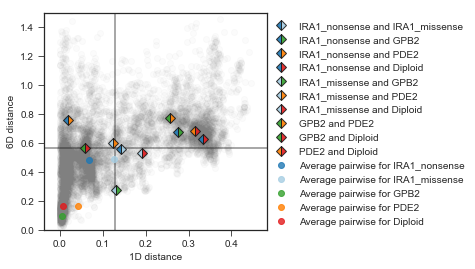

In [176]:
plt.figure(figsize=(4,4))

mean1 = np.mean(distances_1)
mean6 = np.mean(distances_6)



plt.scatter(distances_1,distances_6,alpha=0.03,color='gray')
# plt.scatter(distances_1/mean1,distances_6/mean6,alpha=0.03,color='gray')
# plt.scatter(mean1,mean6,alpha=0.8,color='k',marker='o')
plt.axvline(np.mean(distances_1),color='k',alpha=0.5)
plt.axhline(np.mean(distances_6),color='k',alpha=0.5)

# g = sns.jointplot(distances_1,distances_6,alpha=0.03,color='k')
plt.xlabel('1D distance')
plt.ylabel('6D distance')



for gene1, gene2 in combinations(gene_list,2):
    plt.plot(distance.euclidean(geom_medians1[gene1],geom_medians1[gene2]),
                distance.euclidean(geom_medians6[gene1],geom_medians6[gene2]),
                label=f'{gene1} and {gene2}',color=tools.mutant_colorset[gene1],marker='D',fillstyle = 'left',
            markerfacecoloralt=tools.mutant_colorset[gene2],linestyle='',markersize=7,markeredgecolor='k',alpha=0.9)


#         plt.plot(distance.euclidean(geom_medians1[gene1],geom_medians1[gene2])/mean1,
#                     distance.euclidean(geom_medians6[gene1],geom_medians6[gene2])/mean6,
#                     label=f'{gene1} and {gene2}',color=tools.mutant_colorset[gene1],marker='D',fillstyle = 'left',
#                 markerfacecoloralt=tools.mutant_colorset[gene2],linestyle='',markersize=7,markeredgecolor='k',alpha=0.9)
for gene in gene_list:
    plt.plot(avg_pairwise1[gene],avg_pairwise6[gene],marker='o',linestyle='',color=tools.mutant_colorset[gene],alpha=0.8,label=f'Average pairwise for {gene}')

plt.ylim(0,1.5)
plt.legend(loc=(1.0,0.0))
# plt.savefig('1d_v_6d_distance_alltestBC.pdf',bbox_inches='tight')

In [ ]:
plt.figure(figsize=(8,4))
plt.subplot(121)
these_guesses = [item[0] for item in best_guesses.values()]
plt.axvline(min(total/len(best_guesses)),color='w')
sns.distplot(these_guesses,kde=False,color='red')
plt.xlabel('Variance Explained in Held-Out Group')
plt.ylabel('Number of Folds')
plt.subplot(122)
ranks = [item[1] for item in best_guesses.values()]
sns.distplot(ranks,kde=False,bins=np.arange(min(ranks), max(ranks) + 1),color='r')
plt.axvline(np.where(total==min(total))[0]+1.5,color='w')
plt.xlabel('Best Rank')
# plt.ylabel('Count (of 100)')

plt.xticks(np.arange(min(ranks)+0.5, max(ranks) + 1.5),np.arange(min(ranks), max(ranks)+1 ))
plt.xlim(min(ranks),max(ranks)+1)
plt.savefig('talk_figures/best_rank_found_ALL_groups_2_nomixnmatch_close_conditions_mse.pdf',bbox_inches='tight')

plt.figure()

plt.scatter(tools.jitter_point(ranks),these_guesses,alpha=0.1,marker='.',color='r')
plt.plot(range(1,len(total)+1),total/len(best_guesses),'w',label='Average')
plt.ylabel('Mean Squared Error in Held-Out Fold')
plt.xlabel('Rank')
plt.xticks(range(1,len(total)+1),range(1,len(total)+1))

plt.savefig('talk_figures/bestfit_by_rank_found_ALL_groups_2_nomixnmatch_close_conditions_mse.pdf',bbox_inches='tight')